This script produces one demonstration (tmemperature) transect for each significant SO WOCE line with sufficient GLODAP coverage to warrant a function.

In the GLODAP_WOCE_sections.py file, we have functions that can produce GLODAP data from the following WOCE lines

IO6S

IO8S

IO9S

SO4P

SO4A

P16A

P12

P15

P19

A12a

A12b

A23

TP (trans Pacific)

TI (trans Indian)

TAa (trans Atlantic (a/b options)

TAb (trans Atlantic (a/b options)


for years with crossings.
Call any GLODAP variable for plotting.


![transect_map](transect_map.png)

In [87]:
import xarray as xr
import numpy as np
## plotting
import matplotlib.pyplot as plt
from matplotlib import gridspec
import matplotlib.cm as pcm
import cartopy.crs as ccrs
import matplotlib.path as mpath
import matplotlib.ticker as mticker
import matplotlib.colors as col
import sys
sys.path.append('/home/Ruth.Moorman/')
sys.path.append('/home/Ruth.Moorman/misc_obs/')
### import required python functions
from masking import *
from GLODAP_WOCE_sections import *
import nclcmaps
import warnings
warnings.filterwarnings('ignore')
import logging
logger = logging.getLogger()
logger.setLevel(logging.CRITICAL)

In [2]:
land_map = access_land_map()
from matplotlib import rc, rcParams
rcParams['text.latex.preamble']=[r"\usepackage{amsmath}"]
rc('xtick', labelsize=30) 
rc('ytick', labelsize=30) 
rc('axes', labelsize=30)

In [3]:
filename = '/work/Ruth.Moorman/GLODAP/GLODAPv2.2019_Southern_Ocean_30S.nc'
## this is all the glodap data from the Pacific/Atlantic/Indian basin merged master file from here 
# (https://www.glodap.info/index.php/merged-and-adjusted-data-product/)
# except I've just pulled out all samples south of 30S and saved them into a separate nc file for my convenience
# If you have gfdl computer access you can access at the above filepath, if not you'll need to do you're own processing 
# from the original .mat files

so_glodap = xr.open_dataset(filename)
so_glodap = so_glodap.Southern_Ocean_GLODAP
cruise = so_glodap.cruise.values
unique_cruise = np.unique(cruise)


What variables can you request?

In [4]:
so_glodap.VARIABLE

<xarray.DataArray 'VARIABLE' (VARIABLE: 87)>
array(['temperature', 'theta', 'salinity', 'salinityf', 'salinityqc', 'sigma0',
       'sigma1', 'sigma2', 'sigma3', 'sigma4', 'gamma', 'oxygen', 'oxygenf',
       'oxygenqc', 'aou', 'aouf', 'nitrate', 'nitratef', 'nitrateqc',
       'nitrite', 'nitritef', 'silicate', 'silicatef', 'silicateqc',
       'phosphate', 'phosphatef', 'phosphateqc', 'tco2', 'tco2f', 'tco2qc',
       'talk', 'talkf', 'talkqc', 'phts25p0', 'phts25p0f', 'phtsinsitutp',
       'phtsinsitutpf', 'phtsqc', 'cfc11', 'pcfc11', 'cfc11f', 'cfc11qc',
       'cfc12', 'pcfc12', 'cfc12f', 'cfc12qc', 'cfc113', 'pcfc113', 'cfc113f',
       'cfc113qc', 'ccl4', 'pccl4', 'ccl4f', 'ccl4qc', 'sf6', 'psf6', 'sf6f',
       'c13', 'c13f', 'c13qc', 'c14', 'c14f', 'c14err', 'h3', 'h3f', 'h3err',
       'he3', 'he3f', 'he3err', 'he', 'hef', 'heerr', 'neon', 'neonf',
       'neonerr', 'o18', 'o18f', 'toc', 'tocf', 'doc', 'docf', 'don', 'donf',
       'tdn', 'tdnf', 'chla', 'chlaf'], dtype=object)
Coordinates:
  * VARIABLE  (VARIABLE) object 'temperature' 'theta' ... 'chla' 'chlaf'
    minute    object ...

Make sure spelling is identical as above when designating variables in the functions demonstrated below.
Note some variables are sampled more sparsely than temperature shown below. Some cruises also sample more sparsely than others.

## Example 1: IO6S transect

In [88]:
help(IO6S_GLODAP_profile)

Help on function IO6S_GLODAP_profile in module GLODAP_WOCE_sections:

IO6S_GLODAP_profile(variable, unique_cruise, year, so_glodap)
    Extracts GLODAP bottle data collected along the IO6S WOCE line.
    Bottle data along the cruise line are compressed into latitude/depth space (ignoring small variations in longitude from the main WOCE line) then the point data are linearly interpolated onto fine vertical and horizontal grids to aid visualisation.
    A bathymetry file is generated from information collected from all crossings, this is also linearly interpolated onto a fine latitude grid and used to mask out where interpolation assigns tracer values to non ocean locations.
    
    returns IO6S_var_linear, IO6S_var_linear_horizontal, var_IO6S, bathymetry_mask,IO6S_latitude, IO6S_longitude
    
    inputs:
    variable = string of variable to be extracted, as in so_glodap.VARIABLES (e.g. 'temperature', 'salinity')
    unique_cruise = list of indices marking hte start of each unique crui

In [6]:
_, IO6S_temp_2008_grid, IO6S_temp_2008_scatter, bathymetry_mask_IO6S,IO6S_latitude, IO6S_longitude = IO6S_GLODAP_profile('temperature', unique_cruise, '2008', so_glodap)

In [7]:
def plot_GLODAP_profile_IO6S(var_profile_scatter, var_profile_contour, bathymetry,norm, levels):
    fig = plt.figure(figsize=[30, 30])
    gs = gridspec.GridSpec(2,1)
    ax, ax1= plt.subplot(gs[0]), plt.subplot(gs[1])
    gs.update(hspace = 0.1)

    cmap = nclcmaps.cmap('tbrVar1')
    
    ax.contourf(bathymetry.latitude, bathymetry.depth, bathymetry.fillna(0).values.T, levels = [-1,0,1], colors = ['k', 'w', 'w'], alpha = 0.4)
    var = ax.scatter(var_profile_scatter.latitude, var_profile_scatter.depth, s= 40, c = var_profile_scatter.values, cmap = cmap, norm = norm)
    ax.set_ylim([6000,0])
    ax.set_xlim([-69.1,-33])
    ax.set_ylabel('Depth (m)', fontsize = 30)
    
    ax1.contourf(bathymetry.latitude, bathymetry.depth, bathymetry.fillna(0).values.T, levels = [-1,0,1], colors = ['k', 'w', 'w'], alpha = 0.4)
    var = ax1.contourf(var_profile_contour.latitude, var_profile_contour.depth, var_profile_contour.values.T, cmap = cmap, levels = levels, norm = norm, extend = 'both')
    ax1.set_ylim([6000,0])
    ax1.set_xlim([-69.1,-33])
    ax1.set_ylabel('Depth (m)', fontsize = 30)
    ax1.set_xlabel('Latitude', fontsize = 30)
    
    return fig, ax, var

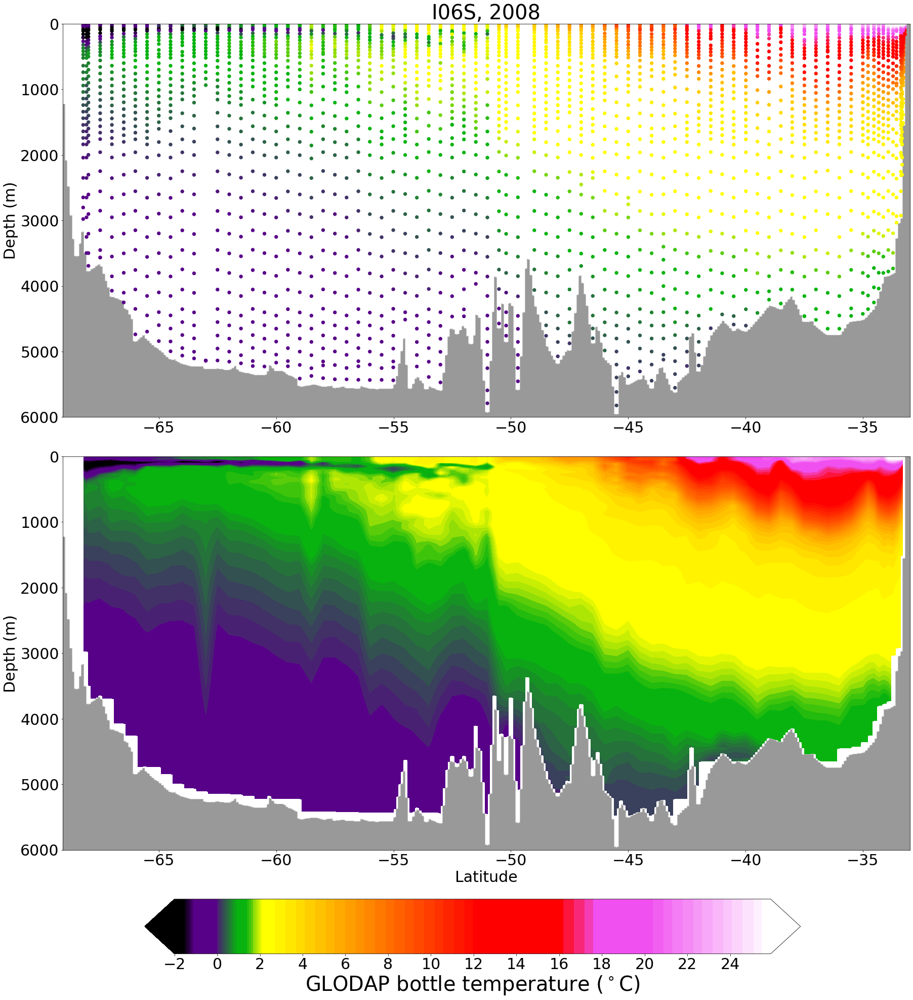

In [8]:
norm = col.DivergingNorm(vmin=-2., vcenter=2.5, vmax=26)
levels = np.arange(-2,26,0.1)

fig, ax, var = plot_GLODAP_profile_IO6S(IO6S_temp_2008_scatter, (IO6S_temp_2008_grid*bathymetry_mask_IO6S), bathymetry_mask_IO6S,norm, levels)
ax.set_title('I06S, 2008', fontsize = 40)

cax = fig.add_axes([0.2, 0.03, 0.6, 0.05])
cbar=plt.colorbar(var,cax = cax,orientation='horizontal',shrink = 0.5, ticks = [-2,0,2,4,6,8,10,12,14,16,18,20,22,24,26])
cbar.set_label(r'GLODAP bottle temperature ($^\circ$C)', fontsize = 40)
# figurepath = 'IO6S_temperature.png'
# plt.savefig(figurepath, dpi=None, facecolor='w', edgecolor='w',orientation='portrait', papertype=None, format='png',transparent=False, bbox_inches='tight', pad_inches=0.1,frameon=None)

plt.show()

In [ ]:
_, IO6S_c14_2008_grid, IO6S_c14_2008_scatter, bathymetry_mask_IO6S,IO6S_latitude, IO6S_longitude = IO6S_GLODAP_profile('c14', unique_cruise, '2008', so_glodap)

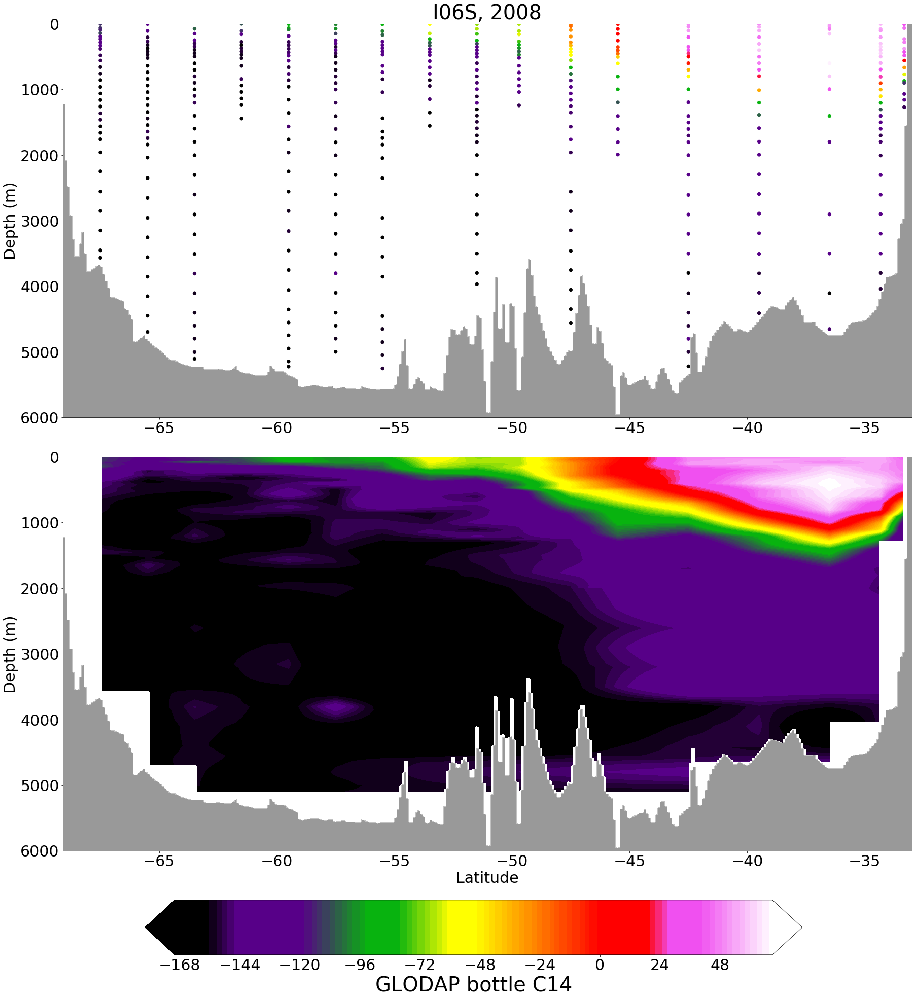

In [92]:
norm = col.DivergingNorm(vmin=-170, vcenter=-50, vmax=70)
levels = np.arange(-170,70,1)

fig, ax, var = plot_GLODAP_profile_IO6S(IO6S_c14_2008_scatter, (IO6S_c14_2008_grid*bathymetry_mask_IO6S), bathymetry_mask_IO6S,norm, levels)
ax.set_title('I06S, 2008', fontsize = 40)

cax = fig.add_axes([0.2, 0.03, 0.6, 0.05])
cbar=plt.colorbar(var,cax = cax,orientation='horizontal',shrink = 0.5)
cbar.set_label(r'GLODAP bottle C14', fontsize = 40)
# figurepath = 'IO6S_temperature.png'
# plt.savefig(figurepath, dpi=None, facecolor='w', edgecolor='w',orientation='portrait', papertype=None, format='png',transparent=False, bbox_inches='tight', pad_inches=0.1,frameon=None)

plt.show()

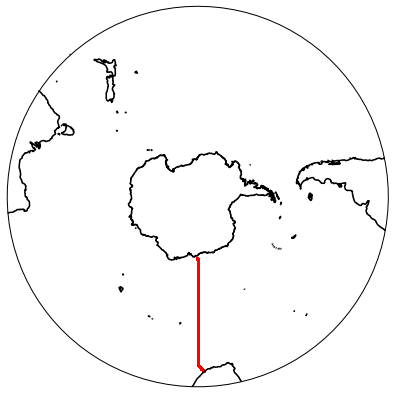

In [9]:
# where is this line?
fig = plt.figure(figsize=[7, 7])
proj = ccrs.Stereographic(central_longitude=-150,central_latitude=-90)
ax= plt.subplot( projection =proj)
lat_north = -29
ax.set_extent([-180, 180, -90, lat_north], ccrs.PlateCarree())
ax.contour(land_map.sel(yt_ocean = slice(-90,lat_north)).xt_ocean, land_map.sel(yt_ocean = slice(-90,lat_north)).yt_ocean,land_map.sel(yt_ocean = slice(-90,lat_north)),[0,1], colors = 'k', alpha = 1, transform=ccrs.PlateCarree())
ax.scatter(IO6S_longitude, IO6S_latitude, s = 2, c = 'r', transform = ccrs.PlateCarree())
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)
plt.show()

## Example 2: P16A transect

In [10]:
help(P16A_GLODAP_profile)

Help on function P16A_GLODAP_profile in module GLODAP_WOCE_sections:

P16A_GLODAP_profile(variable, unique_cruise, year, so_glodap, extend=True)
    Extracts GLODAP bottle data collected along the P16S WOCE line.
    If extend = True is specified, these lines are combined with a 2011 extension that continues south onto the continental shelf.
    Bottle data along the cruise line are compressed into latitude/depth space (ignoring small variations in longitude from the main WOCE line) then the point data are linearly interpolated onto fine vertical and horizontal grids to aid visualisation.
    A bathymetry file is generated from information collected from all crossings, this is also linearly interpolated onto a fine latitude grid and used to mask out where interpolation assigns tracer values to non ocean locations.
    
    returns P16A_var_linear, P16A_var_linear_horizontal, var_P16A, bathymetry_mask,P16A_latitude, P16A_longitude
    
    inputs:
    variable = string of variable to be

In [11]:
_, P16A_temp_2005_grid, P16A_temp_2005_scatter, bathymetry_mask_P16A,P16A_latitude, P16A_longitude = P16A_GLODAP_profile('temperature', unique_cruise, '2005', so_glodap)

In [95]:
def plot_GLODAP_profile_P16A(var_profile_scatter, var_profile_gridded, bathymetry,norm, levels):
    fig = plt.figure(figsize=[30, 30])
    gs = gridspec.GridSpec(2,1)
    ax, ax1= plt.subplot(gs[0]), plt.subplot(gs[1])
    gs.update(hspace = 0.1)

    cmap = nclcmaps.cmap('tbrVar1')
    ax.contourf(bathymetry.latitude, bathymetry.depth, bathymetry.fillna(0).values.T, levels = [-1,0,1], colors = ['k', 'w', 'w'], alpha = 0.4)
    var = ax.scatter(var_profile_scatter.latitude, var_profile_scatter.depth, s= 40, c = var_profile_scatter.values, cmap = cmap, norm = norm)
    ax.set_ylim([6000,0])
    ax.set_xlim([-77,-30])
    ax.set_ylabel('Depth (m)', fontsize = 30)
    
    ax1.contourf(bathymetry.latitude, bathymetry.depth, bathymetry.fillna(0).values.T, levels = [-1,0,1], colors = ['k', 'w', 'w'], alpha = 0.4)
    var = ax1.contourf(var_profile_gridded.latitude, var_profile_gridded.depth, var_profile_gridded.values.T, cmap = cmap, levels = levels, norm = norm, extend = 'both')
    ax1.set_ylim([6000,0])
    ax1.set_xlim([-77,-30])
    ax1.set_ylabel('Depth (m)', fontsize = 30)
    ax1.set_xlabel('Latitude', fontsize = 30)
    
    return fig, ax, var

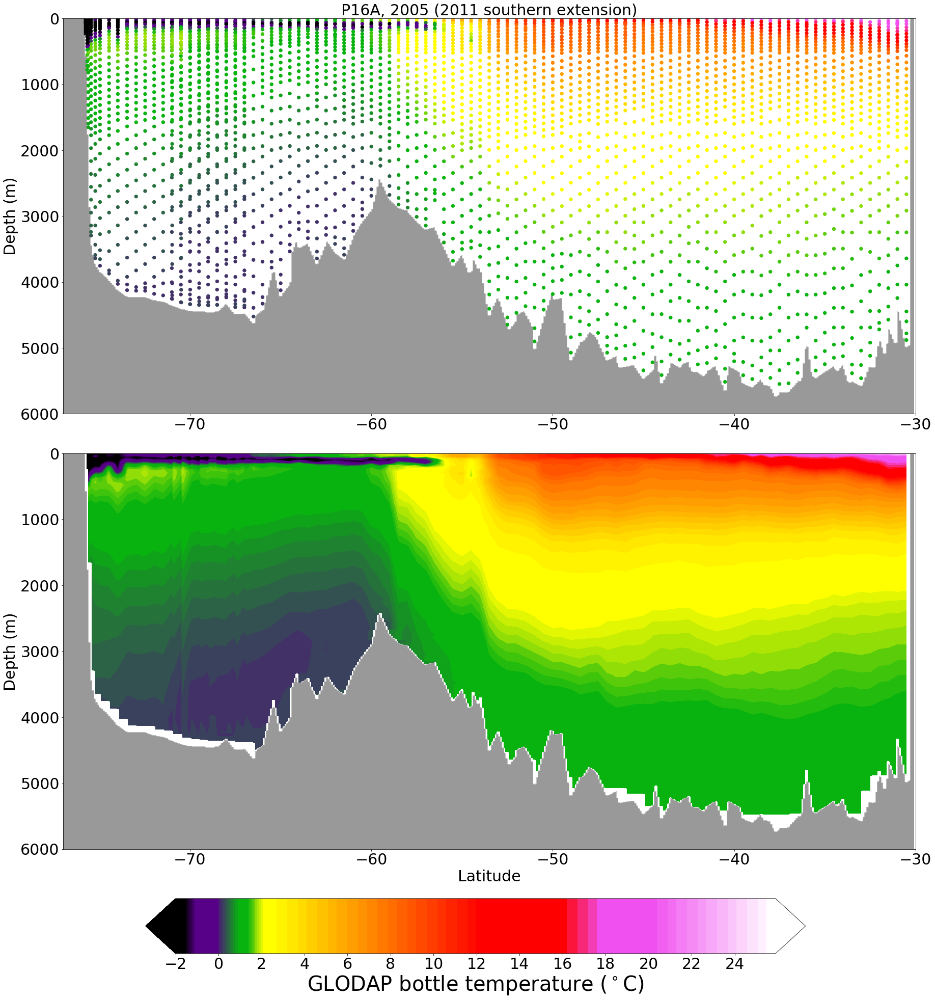

In [13]:
norm = col.DivergingNorm(vmin=-2., vcenter=2.5, vmax=26)
levels = np.arange(-2,26,0.1)

fig, ax = plot_GLODAP_profile_P16A(P16A_temp_2005_scatter, (P16A_temp_2005_grid*bathymetry_mask_P16A), bathymetry_mask_P16A,norm, levels)
ax.set_title('P16A, 2005 (2011 southern extension)', fontsize = 30)

cax = fig.add_axes([0.2, 0.03, 0.6, 0.05])
cbar=plt.colorbar(var,cax = cax,orientation='horizontal',shrink = 0.5, ticks = [-2,0,2,4,6,8,10,12,14,16,18,20,22,24,26])
cbar.set_label(r'GLODAP bottle temperature ($^\circ$C)', fontsize = 40)
# figurepath = 'P16A_temperature.png'
# plt.savefig(figurepath, dpi=None, facecolor='w', edgecolor='w',orientation='portrait', papertype=None, format='png',transparent=False, bbox_inches='tight', pad_inches=0.1,frameon=None)

plt.show()

In [93]:
_, P16A_c14_2008_grid, P16A_c14_2008_scatter, bathymetry_mask_P16A,P16A_latitude, P16A_longitude = P16A_GLODAP_profile('c14', unique_cruise, '2005', so_glodap)

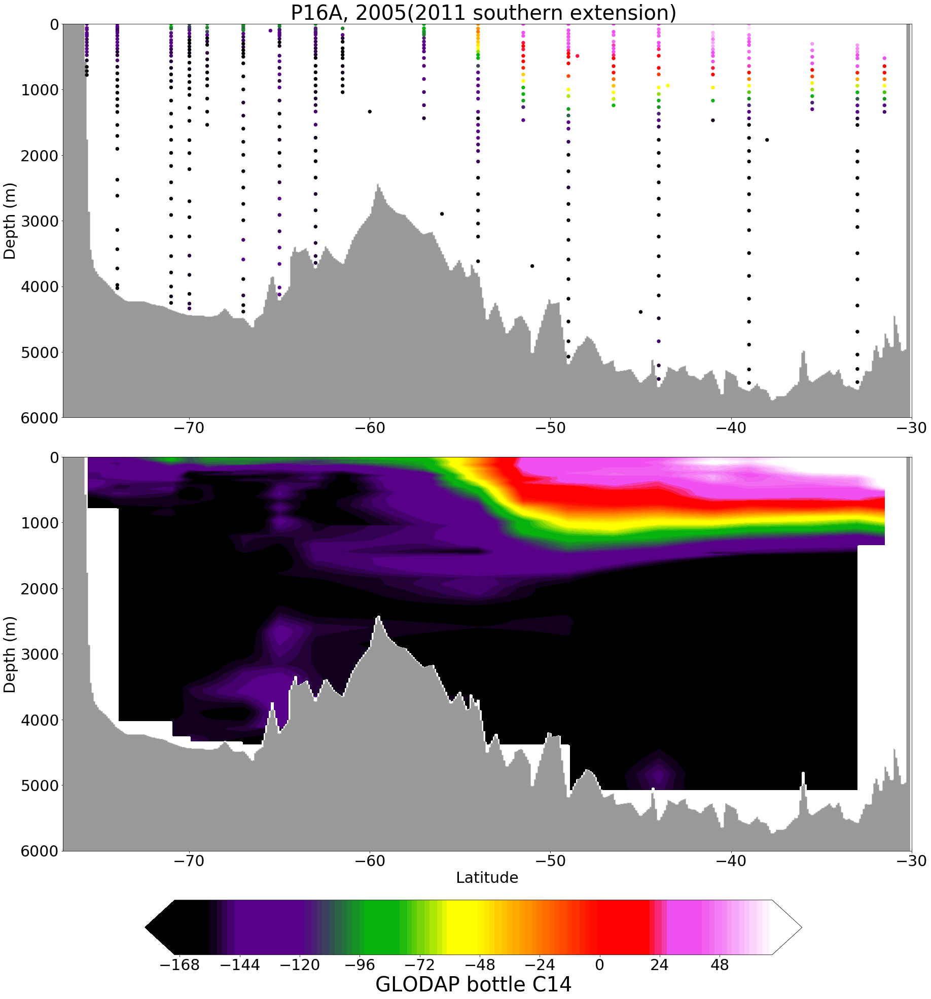

In [96]:
norm = col.DivergingNorm(vmin=-170, vcenter=-50, vmax=70)
levels = np.arange(-170,70,1)

fig, ax, var = plot_GLODAP_profile_P16A(P16A_c14_2008_scatter, (P16A_c14_2008_grid*bathymetry_mask_P16A), bathymetry_mask_P16A,norm, levels)
ax.set_title('P16A, 2005(2011 southern extension) ', fontsize = 40)

cax = fig.add_axes([0.2, 0.03, 0.6, 0.05])
cbar=plt.colorbar(var,cax = cax,orientation='horizontal',shrink = 0.5)
cbar.set_label(r'GLODAP bottle C14', fontsize = 40)
# figurepath = 'IO6S_temperature.png'
# plt.savefig(figurepath, dpi=None, facecolor='w', edgecolor='w',orientation='portrait', papertype=None, format='png',transparent=False, bbox_inches='tight', pad_inches=0.1,frameon=None)

plt.show()

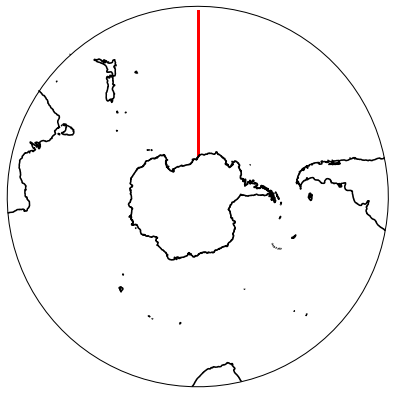

In [14]:
# where is this line?
fig = plt.figure(figsize=[7, 7])
proj = ccrs.Stereographic(central_longitude=-150,central_latitude=-90)
ax= plt.subplot( projection =proj)
lat_north = -29
ax.set_extent([-180, 180, -90, lat_north], ccrs.PlateCarree())
ax.contour(land_map.sel(yt_ocean = slice(-90,lat_north)).xt_ocean, land_map.sel(yt_ocean = slice(-90,lat_north)).yt_ocean,land_map.sel(yt_ocean = slice(-90,lat_north)),[0,1], colors = 'k', alpha = 1, transform=ccrs.PlateCarree())
ax.scatter(P16A_longitude, P16A_latitude, s = 2, c = 'r', transform = ccrs.PlateCarree())
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)
plt.show()

## Example 3: P12 Transect

In [15]:
help(P12_GLODAP_profile)

Help on function P12_GLODAP_profile in module GLODAP_WOCE_sections:

P12_GLODAP_profile(variable, unique_cruise, year, so_glodap)
    Extracts GLODAP bottle data collected along the P16S WOCE line.
    Bottle data along the cruise line are compressed into latitude/depth space (ignoring small variations in longitude from the main WOCE line) then the point data are linearly interpolated onto fine vertical and horizontal grids to aid visualisation.
    A bathymetry file is generated from information collected from all crossings, this is also linearly interpolated onto a fine latitude grid and used to mask out where interpolation assigns tracer values to non ocean locations.
    
    returns P16A_var_linear, P16A_var_linear_horizontal, var_P16A, bathymetry_mask,P16A_latitude, P16A_longitude
    
    inputs:
    variable = string of variable to be extracted, as in so_glodap.VARIABLES (e.g. 'temperature', 'salinity')
    unique_cruise = list of indices marking hte start of each unique cruise

In [16]:
_, P12_temp_2011_grid, P12_temp_2011_scatter, bathymetry_mask_P12,P12_latitude, P12_longitude = P12_GLODAP_profile('temperature', unique_cruise, '2011', so_glodap)

In [17]:
def plot_GLODAP_profile_P12(var_profile_scatter, var_profile_gridded, bathymetry,norm, levels):
    fig = plt.figure(figsize=[30, 30])
    gs = gridspec.GridSpec(2,1)
    ax, ax1= plt.subplot(gs[0]), plt.subplot(gs[1])
    gs.update(hspace = 0.1)

    cmap = nclcmaps.cmap('tbrVar1')
    ax.contourf(bathymetry.latitude, bathymetry.depth, bathymetry.fillna(0).values.T, levels = [-1,0,1], colors = ['k', 'w', 'w'], alpha = 0.4)
    var = ax.scatter(var_profile_scatter.latitude, var_profile_scatter.depth, s= 40, c = var_profile_scatter.values, cmap = cmap, norm = norm)
    ax.set_ylim([5000,0])
    ax.set_xlim([-67,-43.5])
    ax.set_ylabel('Depth (m)', fontsize = 30)
    
    ax1.contourf(bathymetry.latitude, bathymetry.depth, bathymetry.fillna(0).values.T, levels = [-1,0,1], colors = ['k', 'w', 'w'], alpha = 0.4)
    var = ax1.contourf(var_profile_gridded.latitude, var_profile_gridded.depth, var_profile_gridded.values.T, cmap = cmap, levels = levels, norm = norm, extend = 'both')
    ax1.set_ylim([5000,0])
    ax1.set_xlim([-67,-43.5])
    ax1.set_ylabel('Depth (m)', fontsize = 30)
    ax1.set_xlabel('Latitude', fontsize = 30)
    
    return fig, ax

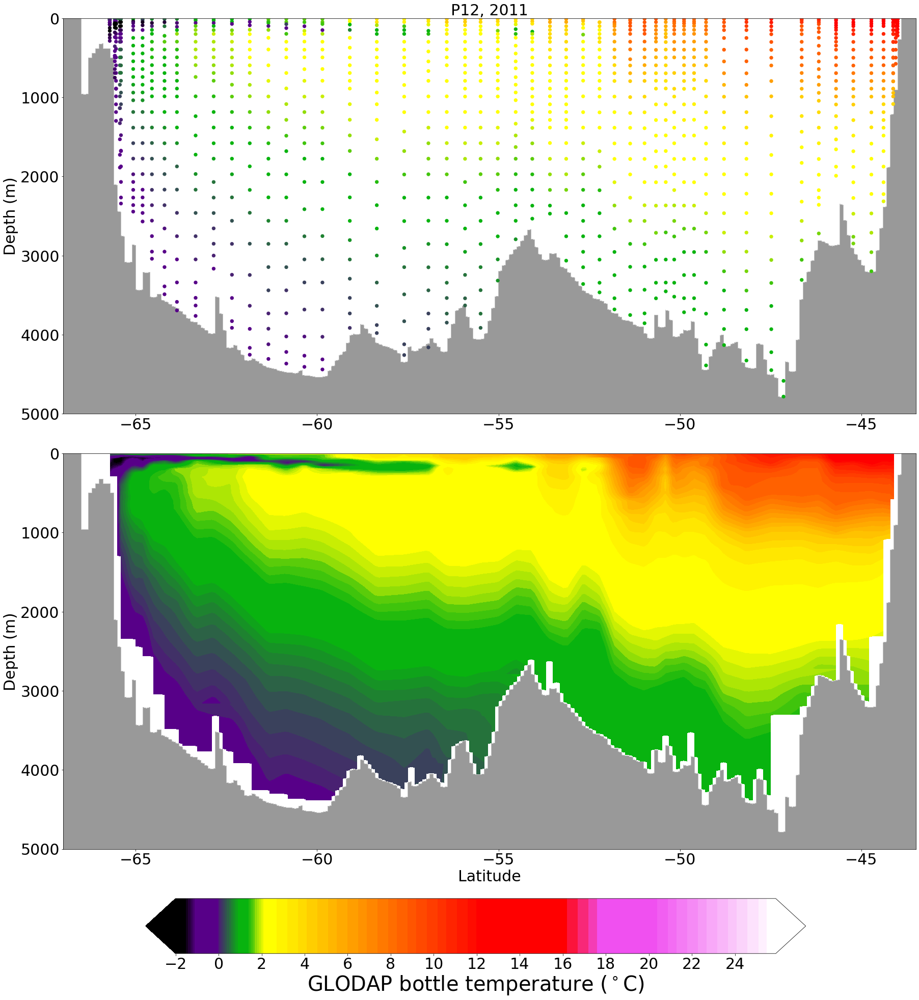

In [18]:
norm = col.DivergingNorm(vmin=-2., vcenter=2.5, vmax=26)
levels = np.arange(-2,26,0.1)

fig, ax = plot_GLODAP_profile_P12(P12_temp_2011_scatter, (P12_temp_2011_grid*bathymetry_mask_P12), bathymetry_mask_P12,norm, levels)
ax.set_title('P12, 2011', fontsize = 30)

cax = fig.add_axes([0.2, 0.03, 0.6, 0.05])
cbar=plt.colorbar(var,cax = cax,orientation='horizontal',shrink = 0.5, ticks = [-2,0,2,4,6,8,10,12,14,16,18,20,22,24,26])
cbar.set_label(r'GLODAP bottle temperature ($^\circ$C)', fontsize = 40)
# figurepath = 'P16A_temperature.png'
# plt.savefig(figurepath, dpi=None, facecolor='w', edgecolor='w',orientation='portrait', papertype=None, format='png',transparent=False, bbox_inches='tight', pad_inches=0.1,frameon=None)

plt.show()

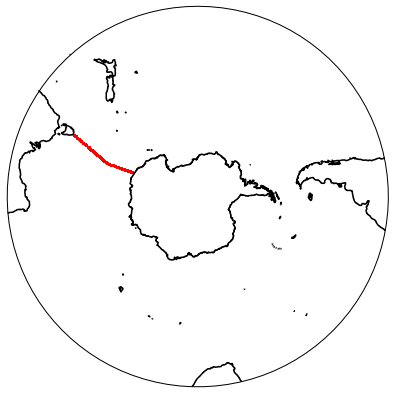

In [19]:
# where is this line?
fig = plt.figure(figsize=[7, 7])
proj = ccrs.Stereographic(central_longitude=-150,central_latitude=-90)
ax= plt.subplot( projection =proj)
lat_north = -29
ax.set_extent([-180, 180, -90, lat_north], ccrs.PlateCarree())
ax.contour(land_map.sel(yt_ocean = slice(-90,lat_north)).xt_ocean, land_map.sel(yt_ocean = slice(-90,lat_north)).yt_ocean,land_map.sel(yt_ocean = slice(-90,lat_north)),[0,1], colors = 'k', alpha = 1, transform=ccrs.PlateCarree())
ax.scatter(P12_longitude, P12_latitude, s = 2, c = 'r', transform = ccrs.PlateCarree())
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)
plt.show()

## Example 4: SO4A Transect

In [20]:
help(SO4A_GLODAP_profile)

Help on function SO4A_GLODAP_profile in module GLODAP_WOCE_sections:

SO4A_GLODAP_profile(variable, unique_cruise, year, so_glodap)
    Extracts GLODAP bottle data collected along the SO4A WOCE line.
    Bottle data along the cruise line are compressed into longitude/depth space (ignoring small variations in latitude from the main WOCE line) then the point data are linearly interpolated onto fine vertical and horizontal grids to aid visualisation.
    A bathymetry file is generated from information collected from all crossings, this is also linearly interpolated onto a fine longitude grid and used to mask out where interpolation assigns tracer values to non ocean locations.
    
    returns SO4A_var_linear, SO4A_var_linear_horizontal, var_SO4A, bathymetry_mask,SO4A_longitude, SO4A_latitude
    
    inputs:
    variable = string of variable to be extracted, as in so_glodap.VARIABLES (e.g. 'temperature', 'salinity')
    unique_cruise = list of indices marking hte start of each unique cru

In [21]:
_, SO4A_temp_2010_grid, SO4A_temp_2010_scatter, bathymetry_mask_SO4A,SO4A_longitude, SO4A_latitude = SO4A_GLODAP_profile('temperature', unique_cruise, '2010', so_glodap)

In [22]:
def plot_GLODAP_profile_SO4A(var_profile_scatter, var_profile_gridded, bathymetry,norm, levels):
    fig = plt.figure(figsize=[30, 30])
    gs = gridspec.GridSpec(2,1)
    ax, ax1= plt.subplot(gs[0]), plt.subplot(gs[1])
    gs.update(hspace = 0.1)

    cmap = nclcmaps.cmap('tbrVar1')

    ax.contourf(bathymetry.longitude, bathymetry.depth, bathymetry.fillna(0).values.T, levels = [-1,0,1], colors = ['k', 'w', 'w'], alpha = 0.4)
    var = ax.scatter(var_profile_scatter.longitude, var_profile_scatter.depth, s= 40, c = var_profile_scatter.values, cmap = cmap, norm = norm)
    ax.set_ylim([5200,0])
    ax.set_xlim([-55,-10])
    ax.set_ylabel('Depth (m)', fontsize = 30)

    ax1.contourf(bathymetry.longitude, bathymetry.depth, bathymetry.fillna(0).values.T, levels = [-1,0,1], colors = ['k', 'w', 'w'], alpha = 0.4)
    var = ax1.contourf(var_profile_gridded.longitude, var_profile_gridded.depth, var_profile_gridded.values.T, cmap = cmap, levels = levels, norm = norm, extend = 'both')
    ax1.set_ylim([5200,0])
    ax1.set_xlim([-55,-10])
    ax1.set_ylabel('Depth (m)', fontsize = 30)
    ax1.set_xlabel('Longitude', fontsize = 30)
    
    return fig, ax, var

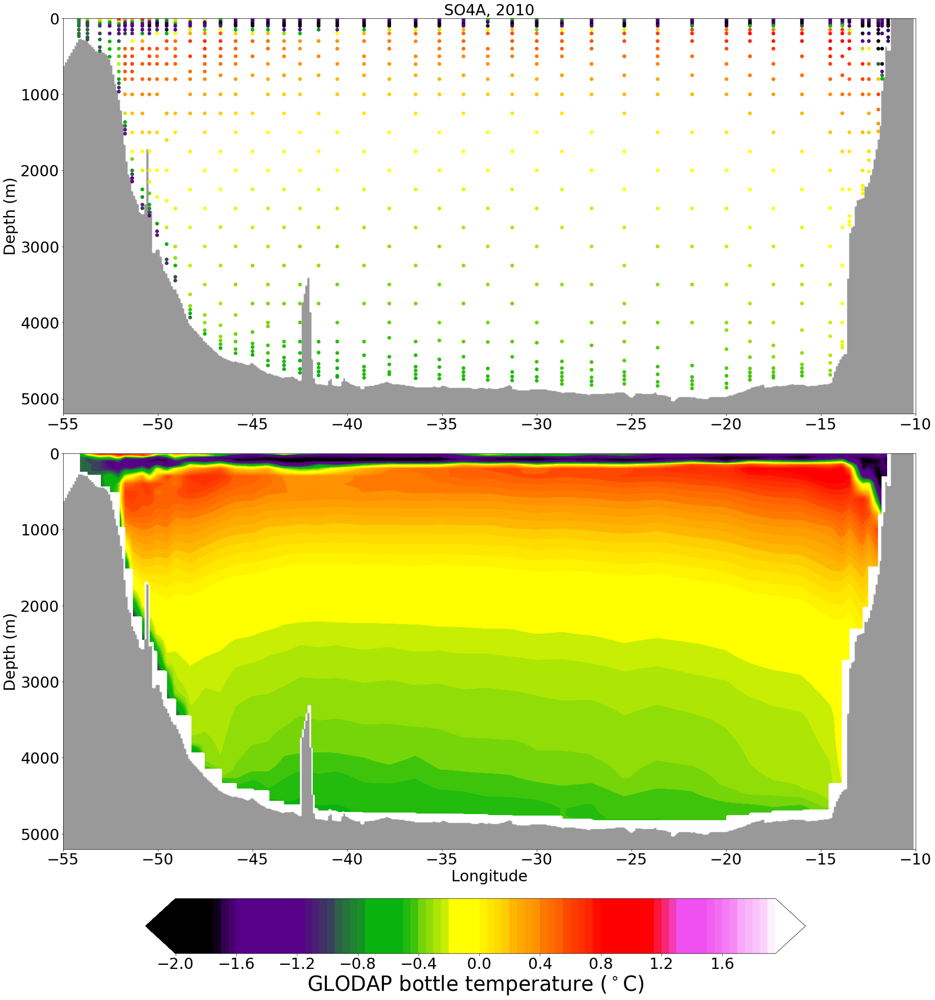

In [23]:
norm = col.DivergingNorm(vmin=-2., vcenter=0, vmax=2)
levels = np.arange(-2,2,0.05)

fig, ax, var = plot_GLODAP_profile_SO4A(SO4A_temp_2010_scatter, (SO4A_temp_2010_grid*bathymetry_mask_SO4A), bathymetry_mask_SO4A,norm, levels)
ax.set_title('SO4A, 2010', fontsize = 30)

cax = fig.add_axes([0.2, 0.03, 0.6, 0.05])
cbar=plt.colorbar(var,cax = cax,orientation='horizontal',shrink = 0.5)
cbar.set_label(r'GLODAP bottle temperature ($^\circ$C)', fontsize = 40)
# figurepath = 'P16A_temperature.png'
# plt.savefig(figurepath, dpi=None, facecolor='w', edgecolor='w',orientation='portrait', papertype=None, format='png',transparent=False, bbox_inches='tight', pad_inches=0.1,frameon=None)

plt.show()

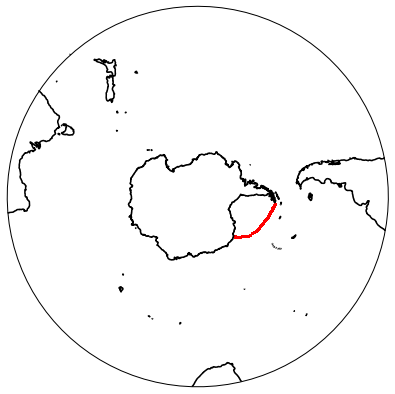

In [24]:
# where is this line?
fig = plt.figure(figsize=[7, 7])
proj = ccrs.Stereographic(central_longitude=-150,central_latitude=-90)
ax= plt.subplot( projection =proj)
lat_north = -29
ax.set_extent([-180, 180, -90, lat_north], ccrs.PlateCarree())
ax.contour(land_map.sel(yt_ocean = slice(-90,lat_north)).xt_ocean, land_map.sel(yt_ocean = slice(-90,lat_north)).yt_ocean,land_map.sel(yt_ocean = slice(-90,lat_north)),[0,1], colors = 'k', alpha = 1, transform=ccrs.PlateCarree())
ax.scatter(SO4A_longitude, SO4A_latitude, s = 2, c = 'r', transform = ccrs.PlateCarree())
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)
plt.show()

## Example 5: A12a transect (there are to A12 like crossing paths)

In [25]:
help(A12a_GLODAP_profile)

Help on function A12a_GLODAP_profile in module GLODAP_WOCE_sections:

A12a_GLODAP_profile(variable, unique_cruise, year, so_glodap)
    Extracts GLODAP bottle data collected along the A12 WOCE line.
    Two slightly different paths are taken by skips in this region, they diverge around 55S.
    A12a is one of these paths.
    Note the 1996, 2005, and 2010 occupations are partial and only traverse the region shared by A12b.
    Bottle data along the cruise line are compressed into latitude/depth space (ignoring small variations in longitude from the main WOCE line) then the point data are linearly interpolated onto fine vertical and horizontal grids to aid visualisation.
    A bathymetry file is generated from information collected from all crossings, this is also linearly interpolated onto a fine latitude grid and used to mask out where interpolation assigns tracer values to non ocean locations.
    
    returns A12_var_linear, A12_var_linear_horizontal, var_A12, bathymetry_mask,A12_la

In [26]:
_, A12a_temp_1992_grid, A12a_temp_1992_scatter, bathymetry_mask_A12a,A12a_latitude, A12a_longitude = A12a_GLODAP_profile('temperature', unique_cruise, '1992', so_glodap)

In [27]:
def plot_GLODAP_profile_A12a(var_profile_scatter, var_profile_contour, bathymetry,norm, levels):
    fig = plt.figure(figsize=[30, 30])
    gs = gridspec.GridSpec(2,1)
    ax, ax1= plt.subplot(gs[0]), plt.subplot(gs[1])
    gs.update(hspace = 0.1)

    cmap = nclcmaps.cmap('tbrVar1')
    
    ax.contourf(bathymetry.latitude, bathymetry.depth, bathymetry.fillna(0).values.T, levels = [-1,0,1], colors = ['k', 'w', 'w'], alpha = 0.4)
    var = ax.scatter(var_profile_scatter.latitude, var_profile_scatter.depth, s= 40, c = var_profile_scatter.values, cmap = cmap, norm = norm)
    ax.set_ylim([6000,0])
    ax.set_xlim([-70,-33])
    ax.set_ylabel('Depth (m)', fontsize = 30)
    
    ax1.contourf(bathymetry.latitude, bathymetry.depth, bathymetry.fillna(0).values.T, levels = [-1,0,1], colors = ['k', 'w', 'w'], alpha = 0.4)
    var = ax1.contourf(var_profile_contour.latitude, var_profile_contour.depth, var_profile_contour.values.T, cmap = cmap, levels = levels, norm = norm, extend = 'both')
    ax1.set_ylim([6000,0])
    ax1.set_xlim([-70,-33])
    ax1.set_ylabel('Depth (m)', fontsize = 30)
    ax1.set_xlabel('Latitude', fontsize = 30)
    
    return fig, ax, var

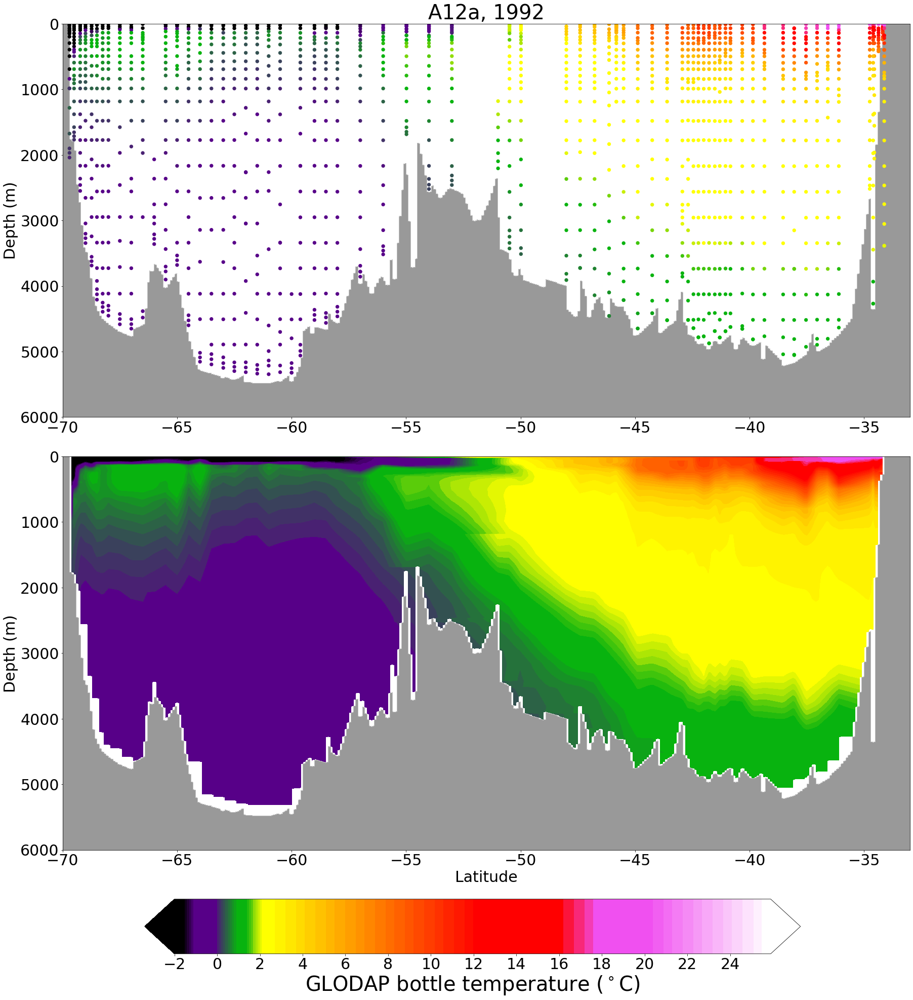

In [28]:
norm = col.DivergingNorm(vmin=-2., vcenter=2.5, vmax=26)
levels = np.arange(-2,26,0.1)

fig, ax, var = plot_GLODAP_profile_A12a(A12a_temp_1992_scatter, (A12a_temp_1992_grid*bathymetry_mask_A12a), bathymetry_mask_A12a,norm, levels)
ax.set_title('A12a, 1992', fontsize = 40)

cax = fig.add_axes([0.2, 0.03, 0.6, 0.05])
cbar=plt.colorbar(var,cax = cax,orientation='horizontal',shrink = 0.5, ticks = [-2,0,2,4,6,8,10,12,14,16,18,20,22,24,26])
cbar.set_label(r'GLODAP bottle temperature ($^\circ$C)', fontsize = 40)
# figurepath = 'IO6S_temperature.png'
# plt.savefig(figurepath, dpi=None, facecolor='w', edgecolor='w',orientation='portrait', papertype=None, format='png',transparent=False, bbox_inches='tight', pad_inches=0.1,frameon=None)

plt.show()

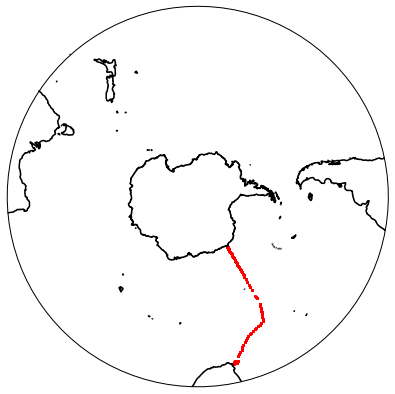

In [29]:
# where is this line?
fig = plt.figure(figsize=[7, 7])
proj = ccrs.Stereographic(central_longitude=-150,central_latitude=-90)
ax= plt.subplot( projection =proj)
lat_north = -29
ax.set_extent([-180, 180, -90, lat_north], ccrs.PlateCarree())
ax.contour(land_map.sel(yt_ocean = slice(-90,lat_north)).xt_ocean, land_map.sel(yt_ocean = slice(-90,lat_north)).yt_ocean,land_map.sel(yt_ocean = slice(-90,lat_north)),[0,1], colors = 'k', alpha = 1, transform=ccrs.PlateCarree())
ax.scatter(A12a_longitude, A12a_latitude, s = 2, c = 'r', transform = ccrs.PlateCarree())
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)
plt.show()

## Example 6: A12b transect (second A12 like path)

In [30]:
help(A12b_GLODAP_profile)

Help on function A12b_GLODAP_profile in module GLODAP_WOCE_sections:

A12b_GLODAP_profile(variable, unique_cruise, year, so_glodap)
    Extracts GLODAP bottle data collected along the A12 WOCE line.
    Two slightly different paths are taken by skips in this region, they diverge around 55S.
    A12b is one of these paths (more recent)
    Note the 1996, 2005, and 2010 occupations are partial and only traverse the region shared by A12a.
    Bottle data along the cruise line are compressed into latitude/depth space (ignoring small variations in longitude from the main WOCE line) then the point data are linearly interpolated onto fine vertical and horizontal grids to aid visualisation.
    A bathymetry file is generated from information collected from all crossings, this is also linearly interpolated onto a fine latitude grid and used to mask out where interpolation assigns tracer values to non ocean locations.
    
    returns A12_var_linear, A12_var_linear_horizontal, var_A12, bathymetr

In [31]:
_, A12b_temp_1992_grid, A12b_temp_1992_scatter, bathymetry_mask_A12b,A12b_latitude, A12b_longitude = A12b_GLODAP_profile('temperature', unique_cruise, '2008', so_glodap)

In [32]:
def plot_GLODAP_profile_A12b(var_profile_scatter, var_profile_contour, bathymetry,norm, levels):
    fig = plt.figure(figsize=[30, 30])
    gs = gridspec.GridSpec(2,1)
    ax, ax1= plt.subplot(gs[0]), plt.subplot(gs[1])
    gs.update(hspace = 0.1)

    cmap = nclcmaps.cmap('tbrVar1')
    
    ax.contourf(bathymetry.latitude, bathymetry.depth, bathymetry.fillna(0).values.T, levels = [-1,0,1], colors = ['k', 'w', 'w'], alpha = 0.4)
    var = ax.scatter(var_profile_scatter.latitude, var_profile_scatter.depth, s= 40, c = var_profile_scatter.values, cmap = cmap, norm = norm)
    ax.set_ylim([6000,0])
    ax.set_xlim([-70,-33])
    ax.set_ylabel('Depth (m)', fontsize = 30)
    
    ax1.contourf(bathymetry.latitude, bathymetry.depth, bathymetry.fillna(0).values.T, levels = [-1,0,1], colors = ['k', 'w', 'w'], alpha = 0.4)
    var = ax1.contourf(var_profile_contour.latitude, var_profile_contour.depth, var_profile_contour.values.T, cmap = cmap, levels = levels, norm = norm, extend = 'both')
    ax1.set_ylim([6000,0])
    ax1.set_xlim([-70,-33])
    ax1.set_ylabel('Depth (m)', fontsize = 30)
    ax1.set_xlabel('Latitude', fontsize = 30)
    
    return fig, ax, var

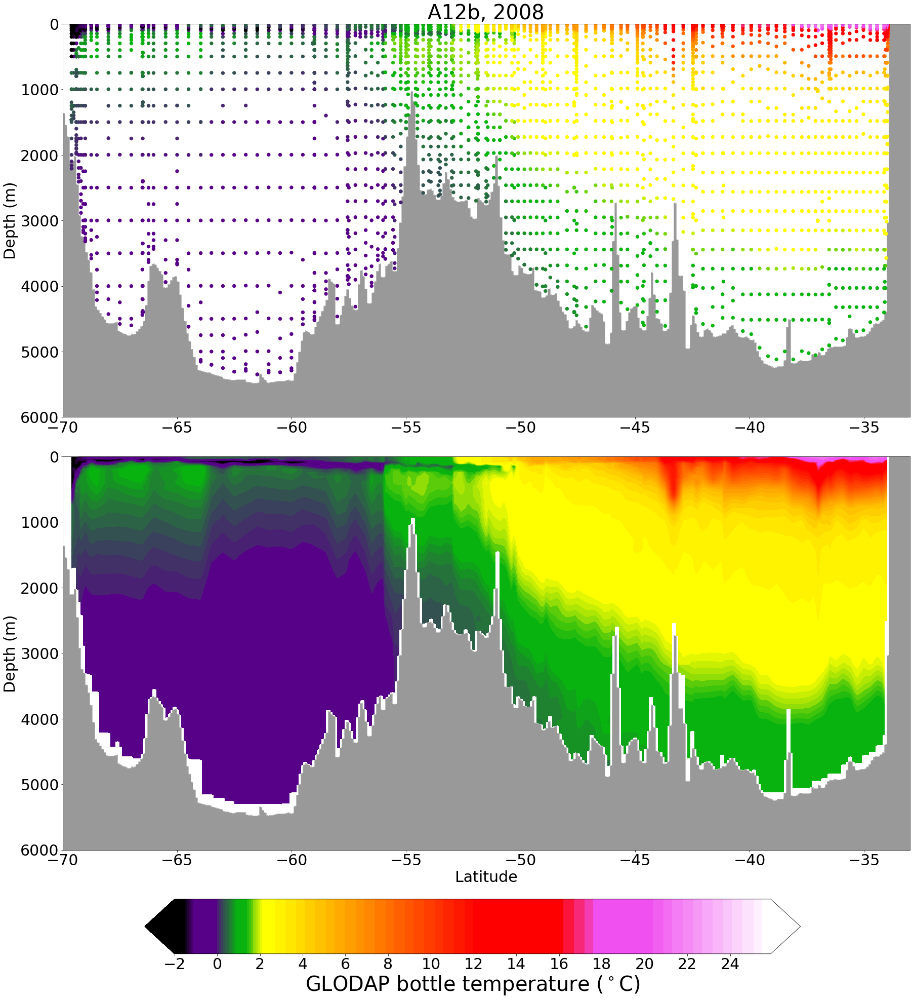

In [33]:
norm = col.DivergingNorm(vmin=-2., vcenter=2.5, vmax=26)
levels = np.arange(-2,26,0.1)

fig, ax, var = plot_GLODAP_profile_A12b(A12b_temp_1992_scatter, (A12b_temp_1992_grid*bathymetry_mask_A12b), bathymetry_mask_A12b,norm, levels)
ax.set_title('A12b, 2008', fontsize = 40)

cax = fig.add_axes([0.2, 0.03, 0.6, 0.05])
cbar=plt.colorbar(var,cax = cax,orientation='horizontal',shrink = 0.5, ticks = [-2,0,2,4,6,8,10,12,14,16,18,20,22,24,26])
cbar.set_label(r'GLODAP bottle temperature ($^\circ$C)', fontsize = 40)
# figurepath = 'IO6S_temperature.png'
# plt.savefig(figurepath, dpi=None, facecolor='w', edgecolor='w',orientation='portrait', papertype=None, format='png',transparent=False, bbox_inches='tight', pad_inches=0.1,frameon=None)

plt.show()

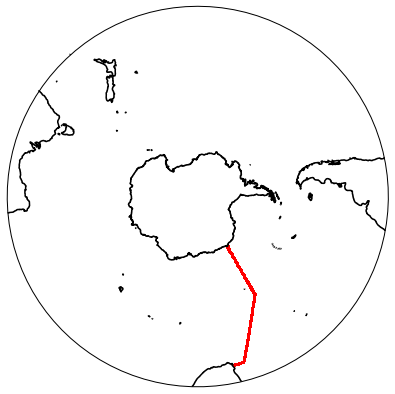

In [34]:
# where is this line?
fig = plt.figure(figsize=[7, 7])
proj = ccrs.Stereographic(central_longitude=-150,central_latitude=-90)
ax= plt.subplot( projection =proj)
lat_north = -29
ax.set_extent([-180, 180, -90, lat_north], ccrs.PlateCarree())
ax.contour(land_map.sel(yt_ocean = slice(-90,lat_north)).xt_ocean, land_map.sel(yt_ocean = slice(-90,lat_north)).yt_ocean,land_map.sel(yt_ocean = slice(-90,lat_north)),[0,1], colors = 'k', alpha = 1, transform=ccrs.PlateCarree())
ax.scatter(A12b_longitude, A12b_latitude, s = 2, c = 'r', transform = ccrs.PlateCarree())

theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)
plt.show()

## Example 7: P15 Transect

In [35]:
help(P15_GLODAP_profile)

Help on function P15_GLODAP_profile in module GLODAP_WOCE_sections:

P15_GLODAP_profile(variable, unique_cruise, year, so_glodap, extend=True)
    Extracts GLODAP bottle data collected along the P15 WOCE line.
    If extend = True is specified, these lines are combined with a 2011 extension that continues south onto the continental shelf (not an option for 2001, 2009 transects which do not extend very far south).
    Bottle data along the cruise line are compressed into latitude/depth space (ignoring small variations in longitude from the main WOCE line) then the point data are linearly interpolated onto fine vertical and horizontal grids to aid visualisation.
    A bathymetry file is generated from information collected from all crossings, this is also linearly interpolated onto a fine latitude grid and used to mask out where interpolation assigns tracer values to non ocean locations.
    
    returns P15_var_linear, P15_var_linear_horizontal, var_P15, bathymetry_mask,P15_latitude, P1

In [36]:
_, P15_temp_2016_grid, P15_temp_2016_scatter, bathymetry_mask_P15,P15_latitude, P15_longitude = P15_GLODAP_profile('temperature', unique_cruise, '2016', so_glodap, extend = True)

In [37]:
def plot_GLODAP_profile_P15(var_profile_scatter, var_profile_contour, bathymetry,norm, levels):
    fig = plt.figure(figsize=[30, 30])
    gs = gridspec.GridSpec(2,1)
    ax, ax1= plt.subplot(gs[0]), plt.subplot(gs[1])
    gs.update(hspace = 0.1)

    cmap = nclcmaps.cmap('tbrVar1')
    
    ax.contourf(bathymetry.latitude, bathymetry.depth, bathymetry.fillna(0).values.T, levels = [-1,0,1], colors = ['k', 'w', 'w'], alpha = 0.4)
    var = ax.scatter(var_profile_scatter.latitude, var_profile_scatter.depth, s= 40, c = var_profile_scatter.values, cmap = cmap, norm = norm)
    ax.set_ylim([6000,0])
    ax.set_xlim([-74.5,-30])
    ax.set_ylabel('Depth (m)', fontsize = 30)
    
    ax1.contourf(bathymetry.latitude, bathymetry.depth, bathymetry.fillna(0).values.T, levels = [-1,0,1], colors = ['k', 'w', 'w'], alpha = 0.4)
    var = ax1.contourf(var_profile_contour.latitude, var_profile_contour.depth, var_profile_contour.values.T, cmap = cmap, levels = levels, norm = norm, extend = 'both')
    ax1.set_ylim([6000,0])
    ax1.set_xlim([-74.5,-30])
    ax1.set_ylabel('Depth (m)', fontsize = 30)
    ax1.set_xlabel('Latitude', fontsize = 30)
    
    return fig, ax, var

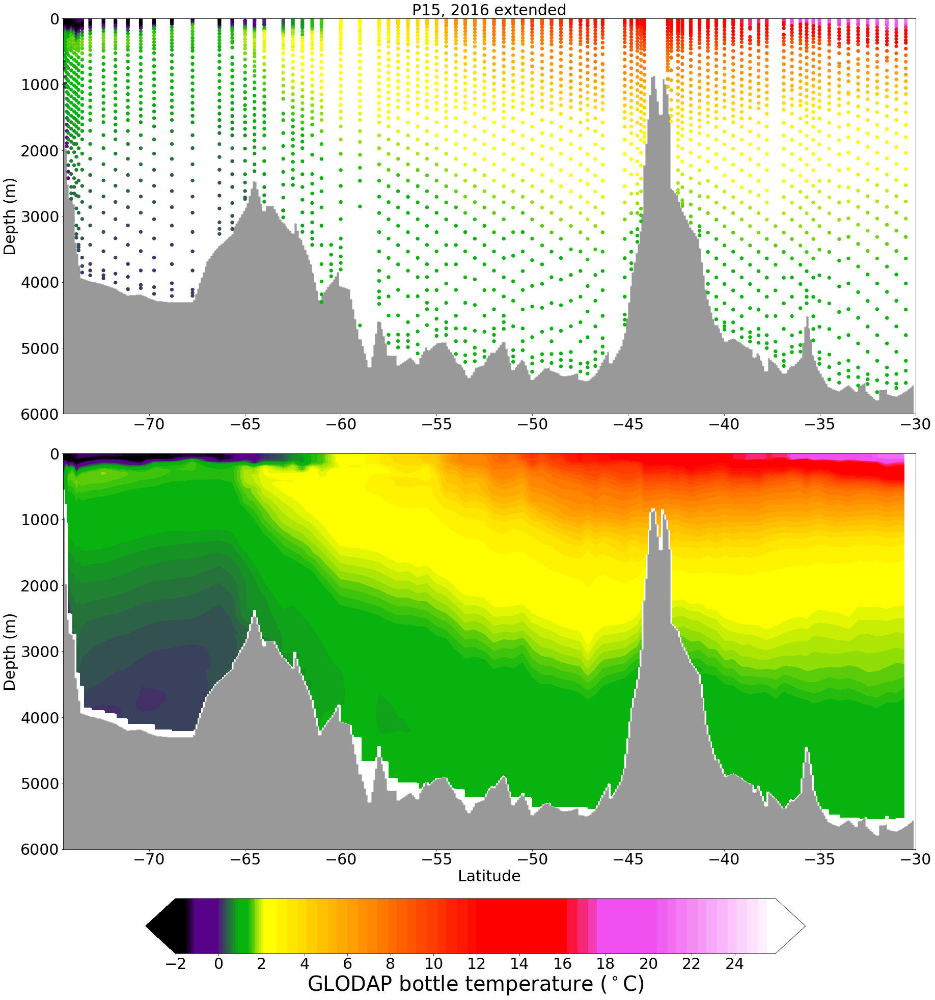

In [38]:
norm = col.DivergingNorm(vmin=-2., vcenter=2.5, vmax=26)
levels = np.arange(-2,26,0.1)

fig, ax, var = plot_GLODAP_profile_P15(P15_temp_2016_scatter, (P15_temp_2016_grid*bathymetry_mask_P15), bathymetry_mask_P15,norm, levels)
ax.set_title('P15, 2016 extended', fontsize = 30)

cax = fig.add_axes([0.2, 0.03, 0.6, 0.05])
cbar=plt.colorbar(var,cax = cax,orientation='horizontal',shrink = 0.5, ticks = [-2,0,2,4,6,8,10,12,14,16,18,20,22,24,26])
cbar.set_label(r'GLODAP bottle temperature ($^\circ$C)', fontsize = 40)
# figurepath = 'IO6S_temperature.png'
# plt.savefig(figurepath, dpi=None, facecolor='w', edgecolor='w',orientation='portrait', papertype=None, format='png',transparent=False, bbox_inches='tight', pad_inches=0.1,frameon=None)

plt.show()

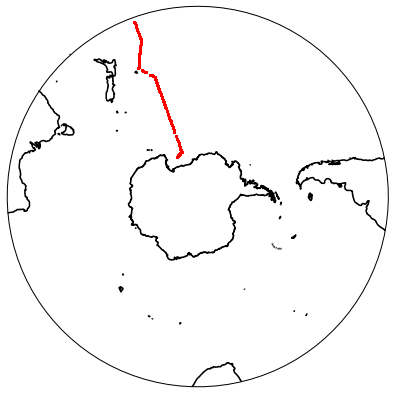

In [39]:
# where is this line?
fig = plt.figure(figsize=[7, 7])
proj = ccrs.Stereographic(central_longitude=-150,central_latitude=-90)
ax= plt.subplot( projection =proj)
lat_north = -29
ax.set_extent([-180, 180, -90, lat_north], ccrs.PlateCarree())
ax.contour(land_map.sel(yt_ocean = slice(-90,lat_north)).xt_ocean, land_map.sel(yt_ocean = slice(-90,lat_north)).yt_ocean,land_map.sel(yt_ocean = slice(-90,lat_north)),[0,1], colors = 'k', alpha = 1, transform=ccrs.PlateCarree())
ax.scatter(P15_longitude, P15_latitude, s = 2, c = 'r', transform = ccrs.PlateCarree())
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)
plt.show()

## Example 8: IO9S

In [40]:
help(IO9S_GLODAP_profile)

Help on function IO9S_GLODAP_profile in module GLODAP_WOCE_sections:

IO9S_GLODAP_profile(variable, unique_cruise, year, so_glodap)
    Extracts GLODAP bottle data collected along the IO9S WOCE line.
    Bottle data along the cruise line are compressed into latitude/depth space (ignoring small variations in longitude from the main WOCE line) then the point data are linearly interpolated onto fine vertical and horizontal grids to aid visualisation.
    A bathymetry file is generated from information collected from all crossings, this is also linearly interpolated onto a fine latitude grid and used to mask out where interpolation assigns tracer values to non ocean locations.
    
    returns IO9S_var_linear, IO9S_var_linear_horizontal, var_IO9S, bathymetry_mask,IO9S_latitude, IO9S_longitude
    
    inputs:
    variable = string of variable to be extracted, as in so_glodap.VARIABLES (e.g. 'temperature', 'salinity')
    unique_cruise = list of indices marking hte start of each unique crui

In [41]:
_, IO9S_temp_2012_grid, IO9S_temp_2012_scatter, bathymetry_mask_IO9S,IO9S_latitude, IO9S_longitude = IO9S_GLODAP_profile('temperature', unique_cruise, '2012', so_glodap)

In [42]:
def plot_GLODAP_profile_IO9S(var_profile_scatter, var_profile_contour, bathymetry,norm, levels):
    fig = plt.figure(figsize=[30, 30])
    gs = gridspec.GridSpec(2,1)
    ax, ax1= plt.subplot(gs[0]), plt.subplot(gs[1])
    gs.update(hspace = 0.1)

    cmap = nclcmaps.cmap('tbrVar1')
    
    ax.contourf(bathymetry.latitude, bathymetry.depth, bathymetry.fillna(0).values.T, levels = [-1,0,1], colors = ['k', 'w', 'w'], alpha = 0.4)
    var = ax.scatter(var_profile_scatter.latitude, var_profile_scatter.depth, s= 40, c = var_profile_scatter.values, cmap = cmap, norm = norm)
    ax.set_ylim([6000,0])
    ax.set_xlim([-66,-33])
    ax.set_ylabel('Depth (m)', fontsize = 30)
    
    ax1.contourf(bathymetry.latitude, bathymetry.depth, bathymetry.fillna(0).values.T, levels = [-1,0,1], colors = ['k', 'w', 'w'], alpha = 0.4)
    var = ax1.contourf(var_profile_contour.latitude, var_profile_contour.depth, var_profile_contour.values.T, cmap = cmap, levels = levels, norm = norm, extend = 'both')
    ax1.set_ylim([6000,0])
    ax1.set_xlim([-66,-33])
    ax1.set_ylabel('Depth (m)', fontsize = 30)
    ax1.set_xlabel('Latitude', fontsize = 30)
    
    return fig, ax, var

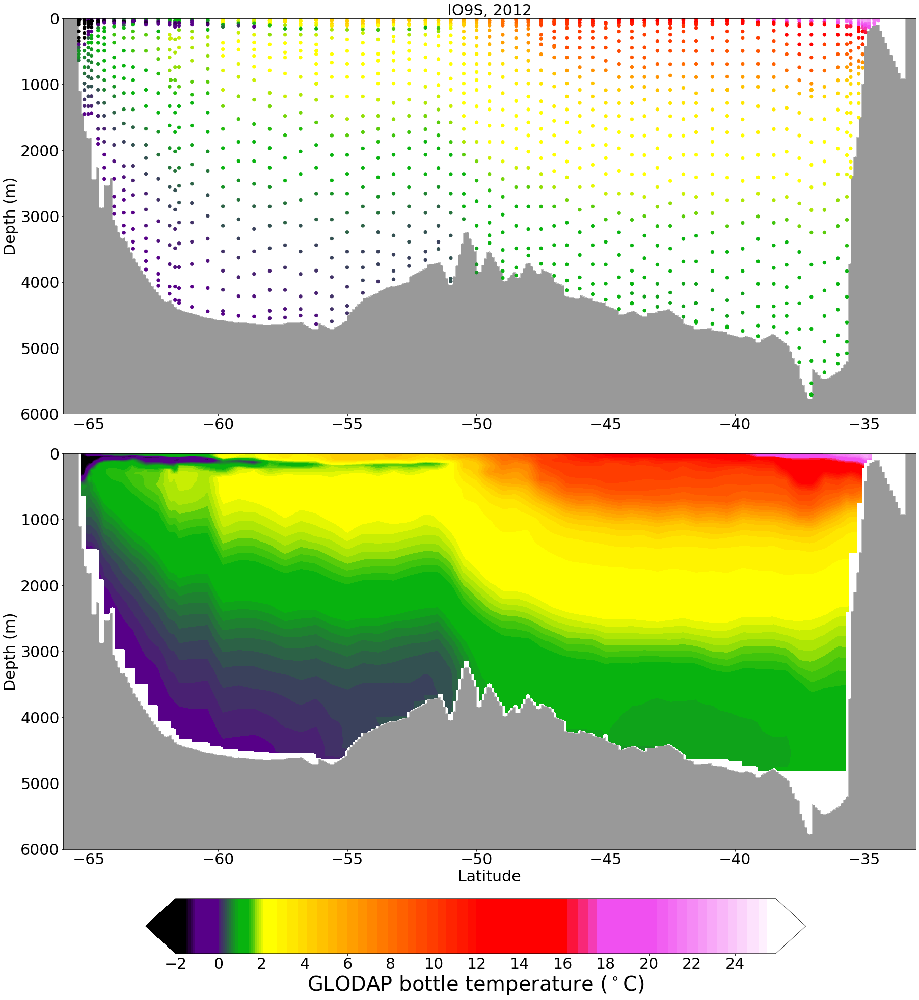

In [43]:
norm = col.DivergingNorm(vmin=-2., vcenter=2.5, vmax=26)
levels = np.arange(-2,26,0.1)

fig, ax, var = plot_GLODAP_profile_IO9S(IO9S_temp_2012_scatter, (IO9S_temp_2012_grid*bathymetry_mask_IO9S), bathymetry_mask_IO9S,norm, levels)
ax.set_title('IO9S, 2012', fontsize = 30)

cax = fig.add_axes([0.2, 0.03, 0.6, 0.05])
cbar=plt.colorbar(var,cax = cax,orientation='horizontal',shrink = 0.5, ticks = [-2,0,2,4,6,8,10,12,14,16,18,20,22,24,26])
cbar.set_label(r'GLODAP bottle temperature ($^\circ$C)', fontsize = 40)
# figurepath = 'IO6S_temperature.png'
# plt.savefig(figurepath, dpi=None, facecolor='w', edgecolor='w',orientation='portrait', papertype=None, format='png',transparent=False, bbox_inches='tight', pad_inches=0.1,frameon=None)

plt.show()

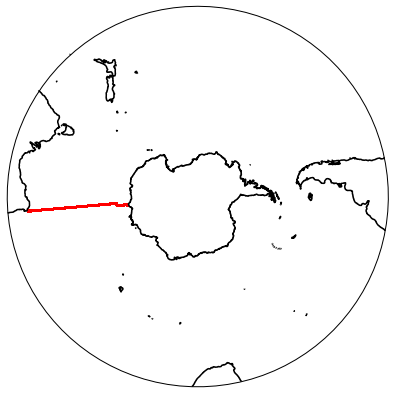

In [44]:
# where is this line?
fig = plt.figure(figsize=[7, 7])
proj = ccrs.Stereographic(central_longitude=-150,central_latitude=-90)
ax= plt.subplot( projection =proj)
lat_north = -29
ax.set_extent([-180, 180, -90, lat_north], ccrs.PlateCarree())
ax.contour(land_map.sel(yt_ocean = slice(-90,lat_north)).xt_ocean, land_map.sel(yt_ocean = slice(-90,lat_north)).yt_ocean,land_map.sel(yt_ocean = slice(-90,lat_north)),[0,1], colors = 'k', alpha = 1, transform=ccrs.PlateCarree())
ax.scatter(IO9S_longitude, IO9S_latitude, s = 2, c = 'r', transform = ccrs.PlateCarree())

theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)
plt.show()

## Example 9: IO8S

In [45]:
help(IO8S_GLODAP_profile)

Help on function IO8S_GLODAP_profile in module GLODAP_WOCE_sections:

IO8S_GLODAP_profile(variable, unique_cruise, year, so_glodap)
    Extracts GLODAP bottle data collected along the IO8S WOCE line.
    Bottle data along the cruise line are compressed into latitude/depth space (ignoring small variations in longitude from the main WOCE line) then the point data are linearly interpolated onto fine vertical and horizontal grids to aid visualisation.
    A bathymetry file is generated from information collected from all crossings, this is also linearly interpolated onto a fine latitude grid and used to mask out where interpolation assigns tracer values to non ocean locations.
    
    returns IO8S_var_linear, IO8S_var_linear_horizontal, var_IO8S, bathymetry_mask,IO8S_latitude, IO8S_longitude
    
    inputs:
    variable = string of variable to be extracted, as in so_glodap.VARIABLES (e.g. 'temperature', 'salinity')
    unique_cruise = list of indices marking hte start of each unique crui

In [46]:
_, IO8S_temp_2016_grid, IO8S_temp_2016_scatter, bathymetry_mask_IO8S,IO8S_latitude, IO8S_longitude = IO8S_GLODAP_profile('temperature', unique_cruise, '2016', so_glodap)

In [47]:
def plot_GLODAP_profile_IO8S(var_profile_scatter, var_profile_contour, bathymetry,norm, levels):
    fig = plt.figure(figsize=[30, 30])
    gs = gridspec.GridSpec(2,1)
    ax, ax1= plt.subplot(gs[0]), plt.subplot(gs[1])
    gs.update(hspace = 0.1)

    cmap = nclcmaps.cmap('tbrVar1')
    
    ax.contourf(bathymetry.latitude, bathymetry.depth, bathymetry.fillna(0).values.T, levels = [-1,0,1], colors = ['k', 'w', 'w'], alpha = 0.4)
    var = ax.scatter(var_profile_scatter.latitude, var_profile_scatter.depth, s= 40, c = var_profile_scatter.values, cmap = cmap, norm = norm)
    ax.set_ylim([6000,0])
    ax.set_xlim([-66.7,-30])
    ax.set_ylabel('Depth (m)', fontsize = 30)
    
    ax1.contourf(bathymetry.latitude, bathymetry.depth, bathymetry.fillna(0).values.T, levels = [-1,0,1], colors = ['k', 'w', 'w'], alpha = 0.4)
    var = ax1.contourf(var_profile_contour.latitude, var_profile_contour.depth, var_profile_contour.values.T, cmap = cmap, levels = levels, norm = norm, extend = 'both')
    ax1.set_ylim([6000,0])
    ax1.set_xlim([-66.7,-30])
    ax1.set_ylabel('Depth (m)', fontsize = 30)
    ax1.set_xlabel('Latitude', fontsize = 30)
    
    return fig, ax, var

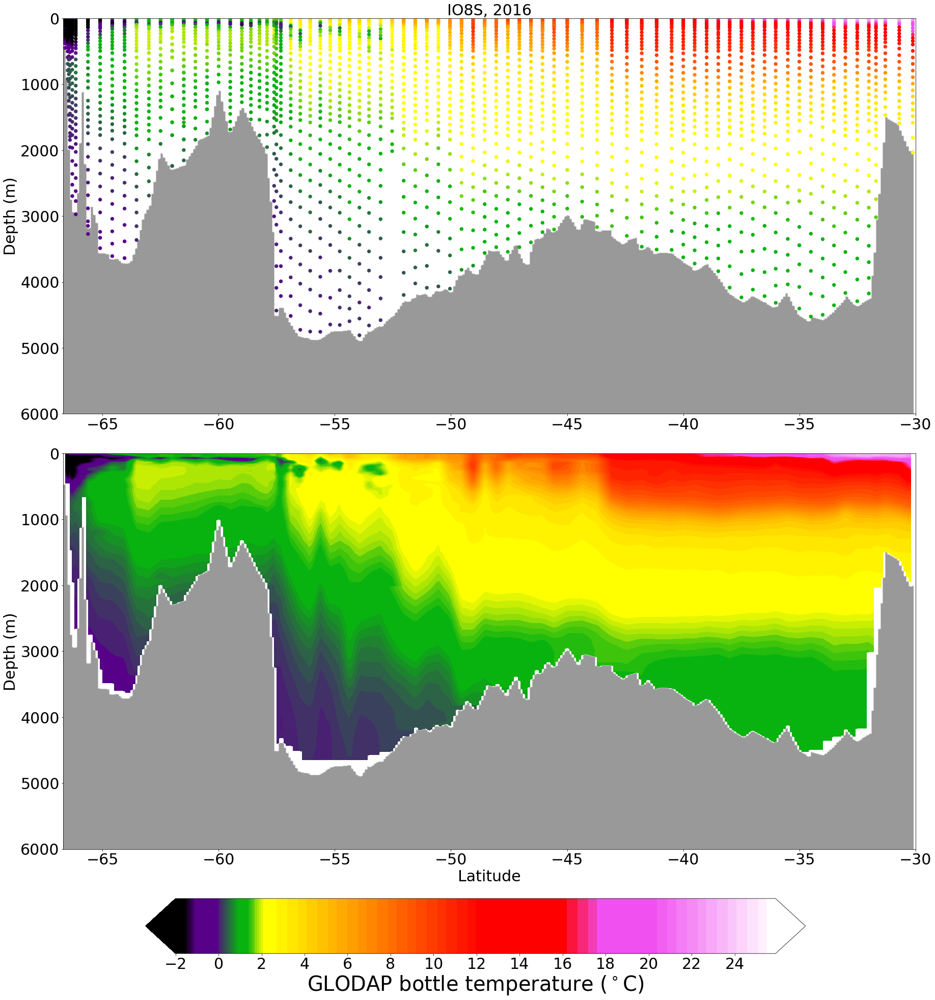

In [48]:
norm = col.DivergingNorm(vmin=-2., vcenter=2.5, vmax=26)
levels = np.arange(-2,26,0.1)

fig, ax, var = plot_GLODAP_profile_IO8S(IO8S_temp_2016_scatter, (IO8S_temp_2016_grid*bathymetry_mask_IO8S), bathymetry_mask_IO8S,norm, levels)
ax.set_title('IO8S, 2016', fontsize = 30)

cax = fig.add_axes([0.2, 0.03, 0.6, 0.05])
cbar=plt.colorbar(var,cax = cax,orientation='horizontal',shrink = 0.5, ticks = [-2,0,2,4,6,8,10,12,14,16,18,20,22,24,26])
cbar.set_label(r'GLODAP bottle temperature ($^\circ$C)', fontsize = 40)
# figurepath = 'IO6S_temperature.png'
# plt.savefig(figurepath, dpi=None, facecolor='w', edgecolor='w',orientation='portrait', papertype=None, format='png',transparent=False, bbox_inches='tight', pad_inches=0.1,frameon=None)

plt.show()

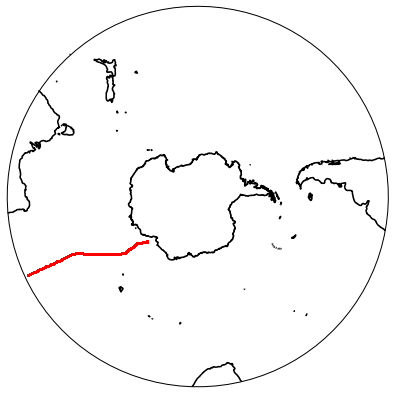

In [49]:
# where is this line?
fig = plt.figure(figsize=[7, 7])
proj = ccrs.Stereographic(central_longitude=-150,central_latitude=-90)
ax= plt.subplot( projection =proj)
lat_north = -29
ax.set_extent([-180, 180, -90, lat_north], ccrs.PlateCarree())
ax.contour(land_map.sel(yt_ocean = slice(-90,lat_north)).xt_ocean, land_map.sel(yt_ocean = slice(-90,lat_north)).yt_ocean,land_map.sel(yt_ocean = slice(-90,lat_north)),[0,1], colors = 'k', alpha = 1, transform=ccrs.PlateCarree())
ax.scatter(IO8S_longitude, IO8S_latitude, s = 2, c = 'r', transform = ccrs.PlateCarree())

theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)
plt.show()

## Example 10: P19

In [50]:
help(P19_GLODAP_profile)

Help on function P19_GLODAP_profile in module GLODAP_WOCE_sections:

P19_GLODAP_profile(variable, unique_cruise, year, so_glodap)
    Extracts GLODAP bottle data collected along the P19 WOCE line.
    Bottle data along the cruise line are compressed into latitude/depth space (ignoring small variations in longitude from the main WOCE line) then the point data are linearly interpolated onto fine vertical and horizontal grids to aid visualisation.
    A bathymetry file is generated from information collected from all crossings, this is also linearly interpolated onto a fine latitude grid and used to mask out where interpolation assigns tracer values to non ocean locations.
    
    returns P19_var_linear, P19_var_linear_horizontal, var_P19, bathymetry_mask,P19_latitude, P19_longitude
    
    inputs:
    variable = string of variable to be extracted, as in so_glodap.VARIABLES (e.g. 'temperature', 'salinity')
    unique_cruise = list of indices marking hte start of each unique cruise in th

In [51]:
_, P19_temp_2016_grid, P19_temp_2016_scatter, bathymetry_mask_P19,P19_latitude, P19_longitude = P19_GLODAP_profile('temperature', unique_cruise, '2017', so_glodap)

In [52]:
def plot_GLODAP_profile_P19(var_profile_scatter, var_profile_contour, bathymetry,norm, levels):
    fig = plt.figure(figsize=[30, 30])
    gs = gridspec.GridSpec(2,1)
    ax, ax1= plt.subplot(gs[0]), plt.subplot(gs[1])
    gs.update(hspace = 0.1)

    cmap = nclcmaps.cmap('tbrVar1')
    
    ax.contourf(bathymetry.latitude, bathymetry.depth, bathymetry.fillna(0).values.T, levels = [-1,0,1], colors = ['k', 'w', 'w'], alpha = 0.4)
    var = ax.scatter(var_profile_scatter.latitude, var_profile_scatter.depth, s= 40, c = var_profile_scatter.values, cmap = cmap, norm = norm)
    ax.set_ylim([6000,0])
    ax.set_xlim([-70.2,-30.5])
    ax.set_ylabel('Depth (m)', fontsize = 30)
    
    ax1.contourf(bathymetry.latitude, bathymetry.depth, bathymetry.fillna(0).values.T, levels = [-1,0,1], colors = ['k', 'w', 'w'], alpha = 0.4)
    var = ax1.contourf(var_profile_contour.latitude, var_profile_contour.depth, var_profile_contour.values.T, cmap = cmap, levels = levels, norm = norm, extend = 'both')
    ax1.set_ylim([6000,0])
    ax1.set_xlim([-70.2,-30.5])
    ax1.set_ylabel('Depth (m)', fontsize = 30)
    ax1.set_xlabel('Latitude', fontsize = 30)
    
    return fig, ax, var

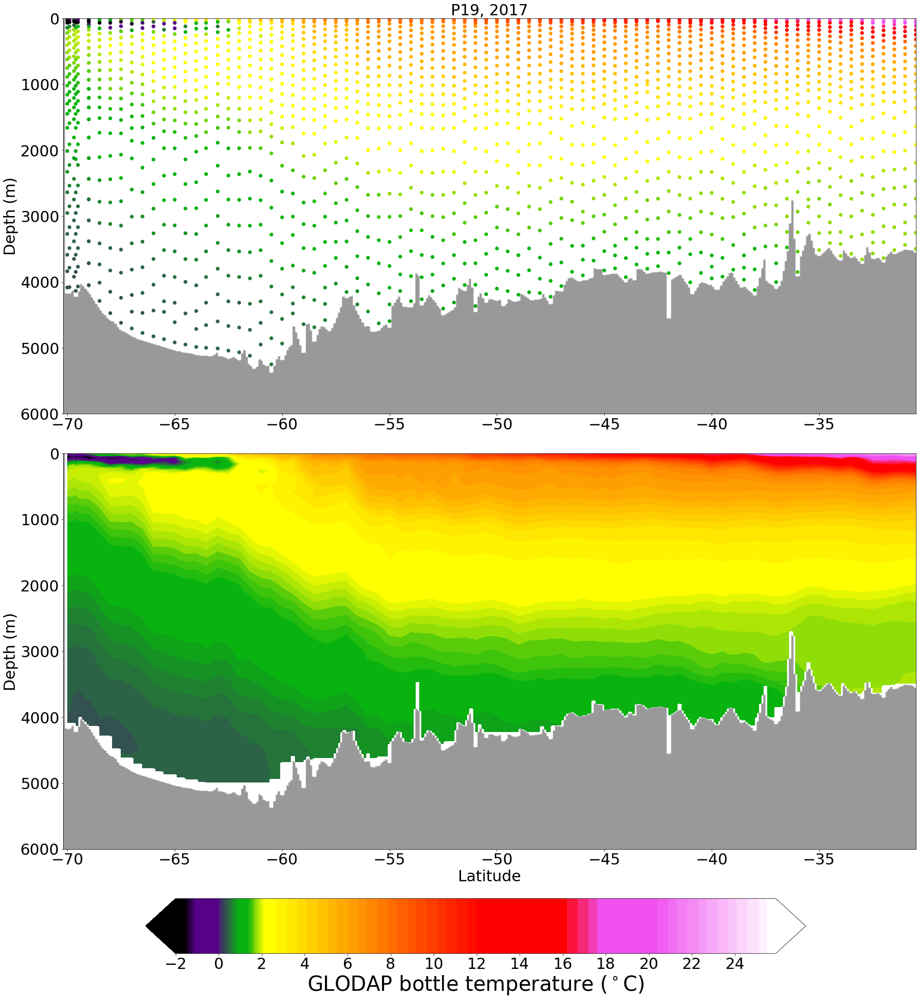

In [53]:
norm = col.DivergingNorm(vmin=-2., vcenter=2.5, vmax=26)
levels = np.arange(-2,26,0.1)

fig, ax, var = plot_GLODAP_profile_P19(P19_temp_2016_scatter, (P19_temp_2016_grid*bathymetry_mask_P19), bathymetry_mask_P19,norm, levels)
ax.set_title('P19, 2017', fontsize = 30)

cax = fig.add_axes([0.2, 0.03, 0.6, 0.05])
cbar=plt.colorbar(var,cax = cax,orientation='horizontal',shrink = 0.5, ticks = [-2,0,2,4,6,8,10,12,14,16,18,20,22,24,26])
cbar.set_label(r'GLODAP bottle temperature ($^\circ$C)', fontsize = 40)
# figurepath = 'IO6S_temperature.png'
# plt.savefig(figurepath, dpi=None, facecolor='w', edgecolor='w',orientation='portrait', papertype=None, format='png',transparent=False, bbox_inches='tight', pad_inches=0.1,frameon=None)

plt.show()

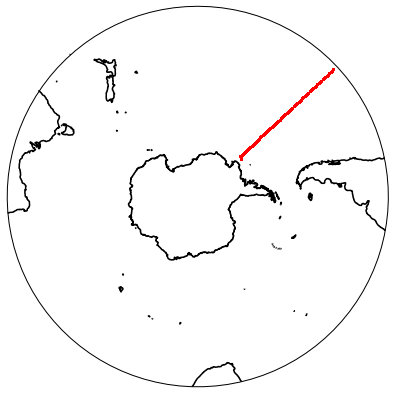

In [54]:
# where is this line?
fig = plt.figure(figsize=[7, 7])
proj = ccrs.Stereographic(central_longitude=-150,central_latitude=-90)
ax= plt.subplot( projection =proj)
lat_north = -29
ax.set_extent([-180, 180, -90, lat_north], ccrs.PlateCarree())
ax.contour(land_map.sel(yt_ocean = slice(-90,lat_north)).xt_ocean, land_map.sel(yt_ocean = slice(-90,lat_north)).yt_ocean,land_map.sel(yt_ocean = slice(-90,lat_north)),[0,1], colors = 'k', alpha = 1, transform=ccrs.PlateCarree())
ax.scatter(P19_longitude, P19_latitude, s = 2, c = 'r', transform = ccrs.PlateCarree())
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)
plt.show()

## Example 11: SO4P

In [55]:
help(SO4P_GLODAP_profile)

Help on function SO4P_GLODAP_profile in module GLODAP_WOCE_sections:

SO4P_GLODAP_profile(variable, unique_cruise, year, so_glodap)
    Extracts GLODAP bottle data collected along the SO4P WOCE line.
    Bottle data along the cruise line are compressed into latitude/depth space (ignoring small variations in latitude from the main WOCE line) then the point data are linearly interpolated onto fine vertical and horizontal grids to aid visualisation.
    A bathymetry file is generated from information collected from all crossings, this is also linearly interpolated onto a fine longitude grid and used to mask out where interpolation assigns tracer values to non ocean locations.
    
    returns SO4P_var_linear, SO4P_var_linear_horizontal, var_SO4P, bathymetry_mask,SO4P_longitude, SO4P_latitude
    
    inputs:
    variable = string of variable to be extracted, as in so_glodap.VARIABLES (e.g. 'temperature', 'salinity')
    unique_cruise = list of indices marking hte start of each unique crui

In [56]:
_, SO4P_temp_2011_grid, SO4P_temp_2011_scatter, bathymetry_mask_SO4P,SO4P_longitude, SO4P_latitude = SO4P_GLODAP_profile('temperature', unique_cruise, '2011', so_glodap)

In [57]:
def plot_GLODAP_profile_SO4P(var_profile_scatter, var_profile_gridded, bathymetry,norm, levels):
    fig = plt.figure(figsize=[30, 30])
    gs = gridspec.GridSpec(2,1)
    ax, ax1= plt.subplot(gs[0]), plt.subplot(gs[1])
    gs.update(hspace = 0.1)

    cmap = nclcmaps.cmap('tbrVar1')

    ax.contourf(bathymetry.longitude, bathymetry.depth, bathymetry.fillna(0).values.T, levels = [-1,0,1], colors = ['k', 'w', 'w'], alpha = 0.4)
    var = ax.scatter(var_profile_scatter.longitude, var_profile_scatter.depth, s= 40, c = var_profile_scatter.values, cmap = cmap, norm = norm)
    ax.set_ylim([5200,0])
    ax.set_xlim([-180,-72.5])
    ax.set_ylabel('Depth (m)', fontsize = 30)

    ax1.contourf(bathymetry.longitude, bathymetry.depth, bathymetry.fillna(0).values.T, levels = [-1,0,1], colors = ['k', 'w', 'w'], alpha = 0.4)
    var = ax1.contourf(var_profile_gridded.longitude, var_profile_gridded.depth, var_profile_gridded.values.T, cmap = cmap, levels = levels, norm = norm, extend = 'both')
    ax1.set_ylim([5200,0])
    ax1.set_xlim([-180,-72.5])
    ax1.set_ylabel('Depth (m)', fontsize = 30)
    ax1.set_xlabel('Longitude', fontsize = 30)
    
    return fig, ax, var

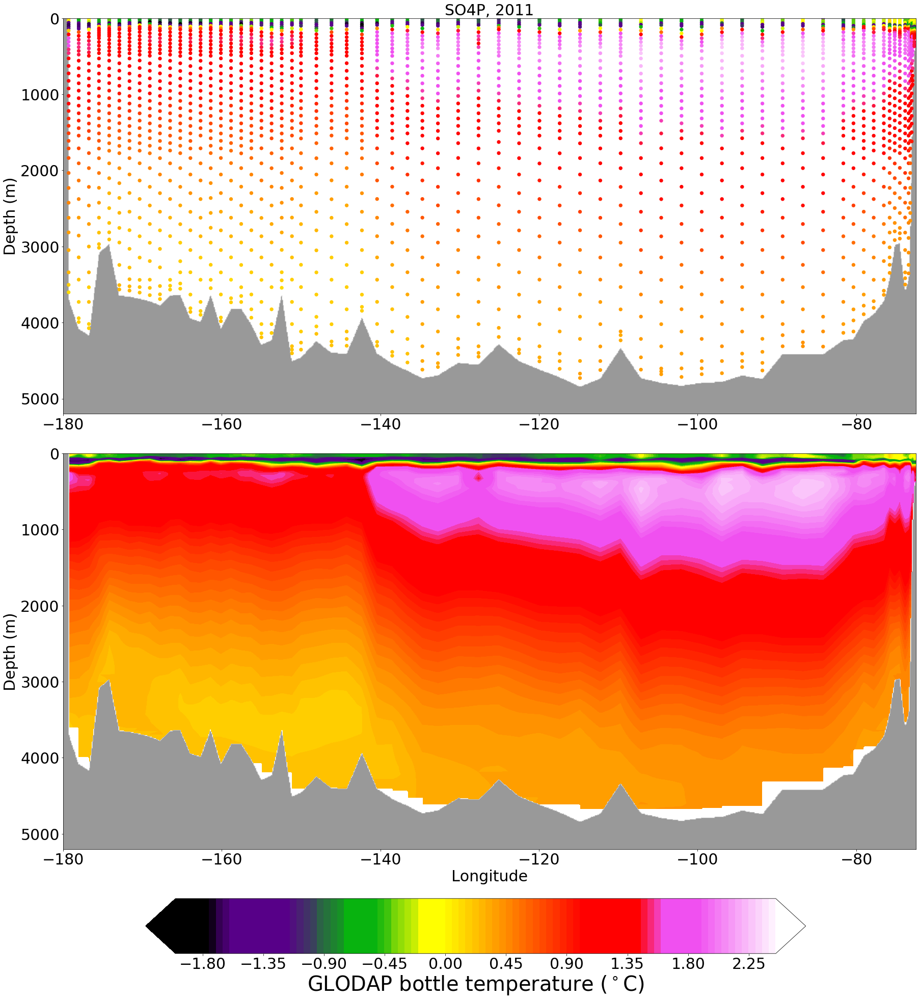

In [58]:
norm = col.DivergingNorm(vmin=-2., vcenter=0, vmax=2.5)
levels = np.arange(-2,2.5,0.05)

fig, ax, var = plot_GLODAP_profile_SO4P(SO4P_temp_2011_scatter, (SO4P_temp_2011_grid*bathymetry_mask_SO4P), bathymetry_mask_SO4P,norm, levels)
ax.set_title('SO4P, 2011', fontsize = 30)

cax = fig.add_axes([0.2, 0.03, 0.6, 0.05])
cbar=plt.colorbar(var,cax = cax,orientation='horizontal',shrink = 0.5)
cbar.set_label(r'GLODAP bottle temperature ($^\circ$C)', fontsize = 40)
# figurepath = 'IO6S_temperature.png'
# plt.savefig(figurepath, dpi=None, facecolor='w', edgecolor='w',orientation='portrait', papertype=None, format='png',transparent=False, bbox_inches='tight', pad_inches=0.1,frameon=None)

plt.show()

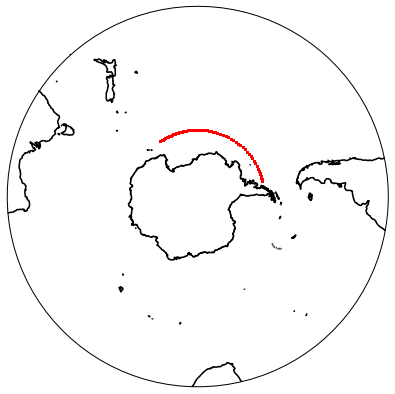

In [59]:
# where is this line?
fig = plt.figure(figsize=[7, 7])
proj = ccrs.Stereographic(central_longitude=-150,central_latitude=-90)
ax= plt.subplot( projection =proj)
lat_north = -29
ax.set_extent([-180, 180, -90, lat_north], ccrs.PlateCarree())
ax.contour(land_map.sel(yt_ocean = slice(-90,lat_north)).xt_ocean, land_map.sel(yt_ocean = slice(-90,lat_north)).yt_ocean,land_map.sel(yt_ocean = slice(-90,lat_north)),[0,1], colors = 'k', alpha = 1, transform=ccrs.PlateCarree())
ax.scatter(SO4P_longitude, SO4P_latitude, s = 2, c = 'r', transform = ccrs.PlateCarree())
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)
plt.show()

## Example 12: A23 (ish, most southern extending version)

In [60]:
help(A23_GLODAP_profile)

Help on function A23_GLODAP_profile in module GLODAP_WOCE_sections:

A23_GLODAP_profile(variable, unique_cruise, so_glodap)
    Extracts GLODAP bottle data collected along the A23 (ish) WOCE line.
    Bottle data along the cruise line are compressed into latitude/depth space (ignoring small variations in longitude from the main WOCE line) then the point data are linearly interpolated onto fine vertical and horizontal grids to aid visualisation.
    A bathymetry file is generated from information collected from all crossings, this is also linearly interpolated onto a fine latitude grid and used to mask out where interpolation assigns tracer values to non ocean locations.
    
    returns A23_var_linear, A23_var_linear_horizontal, var_A23, bathymetry_mask,A23_latitude, A23_longitude
    
    inputs:
    variable = string of variable to be extracted, as in so_glodap.VARIABLES (e.g. 'temperature', 'salinity')
    unique_cruise = list of indices marking hte start of each unique cruise in th

In [61]:
_, A23_temp_1995_grid, A23_temp_1995_scatter, bathymetry_mask_A23,A23_latitude, A23_longitude = A23_GLODAP_profile('temperature', unique_cruise, so_glodap)

In [62]:
def plot_GLODAP_profile_A23(var_profile_scatter, var_profile_contour, bathymetry,norm, levels):
    fig = plt.figure(figsize=[30, 30])
    gs = gridspec.GridSpec(2,1)
    ax, ax1= plt.subplot(gs[0]), plt.subplot(gs[1])
    gs.update(hspace = 0.1)

    cmap = nclcmaps.cmap('tbrVar1')
    
    ax.contourf(bathymetry.latitude, bathymetry.depth, bathymetry.fillna(0).values.T, levels = [-1,0,1], colors = ['k', 'w', 'w'], alpha = 0.4)
    var = ax.scatter(var_profile_scatter.latitude, var_profile_scatter.depth, s= 40, c = var_profile_scatter.values, cmap = cmap, norm = norm)
    ax.set_ylim([6000,0])
    ax.set_xlim([-72,-30.5])
    ax.set_ylabel('Depth (m)', fontsize = 30)
    
    ax1.contourf(bathymetry.latitude, bathymetry.depth, bathymetry.fillna(0).values.T, levels = [-1,0,1], colors = ['k', 'w', 'w'], alpha = 0.4)
    var = ax1.contourf(var_profile_contour.latitude, var_profile_contour.depth, var_profile_contour.values.T, cmap = cmap, levels = levels, norm = norm, extend = 'both')
    ax1.set_ylim([6000,0])
    ax1.set_xlim([-72,-30.5])
    ax1.set_ylabel('Depth (m)', fontsize = 30)
    ax1.set_xlabel('Latitude', fontsize = 30)
    
    return fig, ax, var

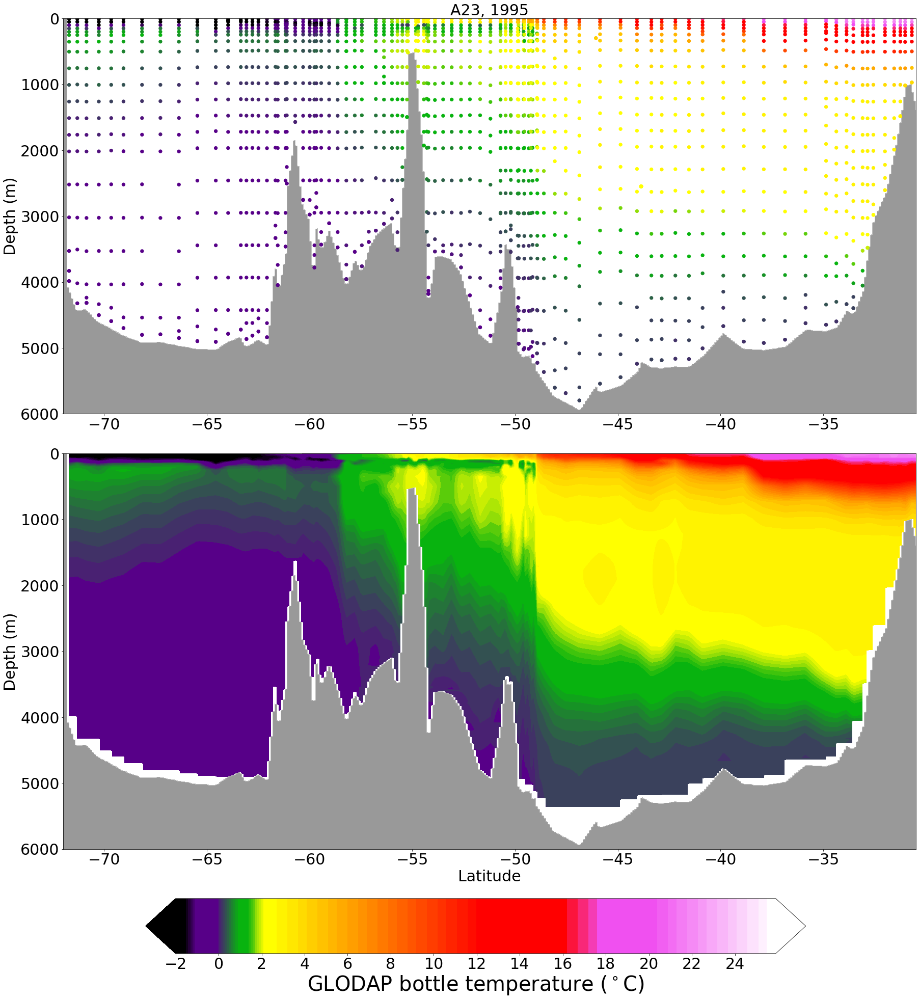

In [63]:
norm = col.DivergingNorm(vmin=-2., vcenter=2.5, vmax=26)
levels = np.arange(-2,26,0.1)

fig, ax, var = plot_GLODAP_profile_A23(A23_temp_1995_scatter, (A23_temp_1995_grid*bathymetry_mask_A23), bathymetry_mask_A23,norm, levels)
ax.set_title('A23, 1995', fontsize = 30)

cax = fig.add_axes([0.2, 0.03, 0.6, 0.05])
cbar=plt.colorbar(var,cax = cax,orientation='horizontal',shrink = 0.5, ticks = [-2,0,2,4,6,8,10,12,14,16,18,20,22,24,26])
cbar.set_label(r'GLODAP bottle temperature ($^\circ$C)', fontsize = 40)
# figurepath = 'IO6S_temperature.png'
# plt.savefig(figurepath, dpi=None, facecolor='w', edgecolor='w',orientation='portrait', papertype=None, format='png',transparent=False, bbox_inches='tight', pad_inches=0.1,frameon=None)

plt.show()

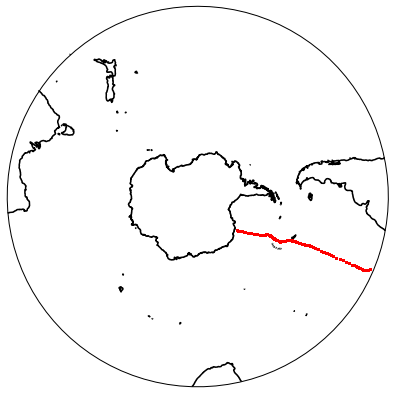

In [64]:
# where is this line?
fig = plt.figure(figsize=[7, 7])
proj = ccrs.Stereographic(central_longitude=-150,central_latitude=-90)
ax= plt.subplot( projection =proj)
lat_north = -29
ax.set_extent([-180, 180, -90, lat_north], ccrs.PlateCarree())
ax.contour(land_map.sel(yt_ocean = slice(-90,lat_north)).xt_ocean, land_map.sel(yt_ocean = slice(-90,lat_north)).yt_ocean,land_map.sel(yt_ocean = slice(-90,lat_north)),[0,1], colors = 'k', alpha = 1, transform=ccrs.PlateCarree())
ax.scatter(A23_longitude, A23_latitude, s = 2, c = 'r', transform = ccrs.PlateCarree())
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)
plt.show()

## Example 13: Trans Pacific 30S crossing (TP)

In [65]:
help(TP_GLODAP_profile)

Help on function TP_GLODAP_profile in module GLODAP_WOCE_sections:

TP_GLODAP_profile(variable, unique_cruise, year, so_glodap)
    Extracts GLODAP bottle data collected along a trans Pacific southern ocean transect (around 30S)
    Bottle data along the cruise line are compressed into longitude/depth space (ignoring small variations in latitude from the main line) then the point data are linearly interpolated onto fine vertical and horizontal grids to aid visualisation.
    A bathymetry file is generated from information collected from all crossings, this is also linearly interpolated onto a fine longitude grid and used to mask out where interpolation assigns tracer values to non ocean locations.
    
    returns TP_var_linear, TP_var_linear_horizontal, var_TP, bathymetry_mask,TP_latitude, TP_longitude
    
    inputs:
    variable = string of variable to be extracted, as in so_glodap.VARIABLES (e.g. 'temperature', 'salinity')
    unique_cruise = list of indices marking hte start of e

In [66]:
_, TP_temp_2010_grid, TP_temp_2010_scatter, bathymetry_mask_TP,TP_longitude, TP_latitude = TP_GLODAP_profile('temperature', unique_cruise, '2009-2010', so_glodap)

In [67]:
def plot_GLODAP_profile_TP(var_profile_scatter, var_profile_contour, bathymetry,norm, levels):
    fig = plt.figure(figsize=[30, 30])
    gs = gridspec.GridSpec(2,1)
    ax, ax1= plt.subplot(gs[0]), plt.subplot(gs[1])
    gs.update(hspace = 0.1)

    cmap = nclcmaps.cmap('tbrVar1')
    
    ax.contourf(bathymetry.longitude, bathymetry.depth, bathymetry.fillna(0).values.T, levels = [-1,0,1], colors = ['k', 'w', 'w'], alpha = 0.4)
    var = ax.scatter(var_profile_scatter.longitude, var_profile_scatter.depth, s= 40, c = var_profile_scatter.values, cmap = cmap, norm = norm)
    ax.set_ylim([6000,0])
    ax.set_xlim([153,289])
    ax.set_ylabel('Depth (m)', fontsize = 30)
    
    ax1.contourf(bathymetry.longitude, bathymetry.depth, bathymetry.fillna(0).values.T, levels = [-1,0,1], colors = ['k', 'w', 'w'], alpha = 0.4)
    var = ax1.contourf(var_profile_contour.longitude, var_profile_contour.depth, var_profile_contour.values.T, cmap = cmap, levels = levels, norm = norm, extend = 'both')
    ax1.set_ylim([6000,0])
    ax1.set_xlim([153,289])
    ax1.set_ylabel('Depth (m)', fontsize = 30)
    ax1.set_xlabel('Latitude', fontsize = 30)
    
    return fig, ax, var

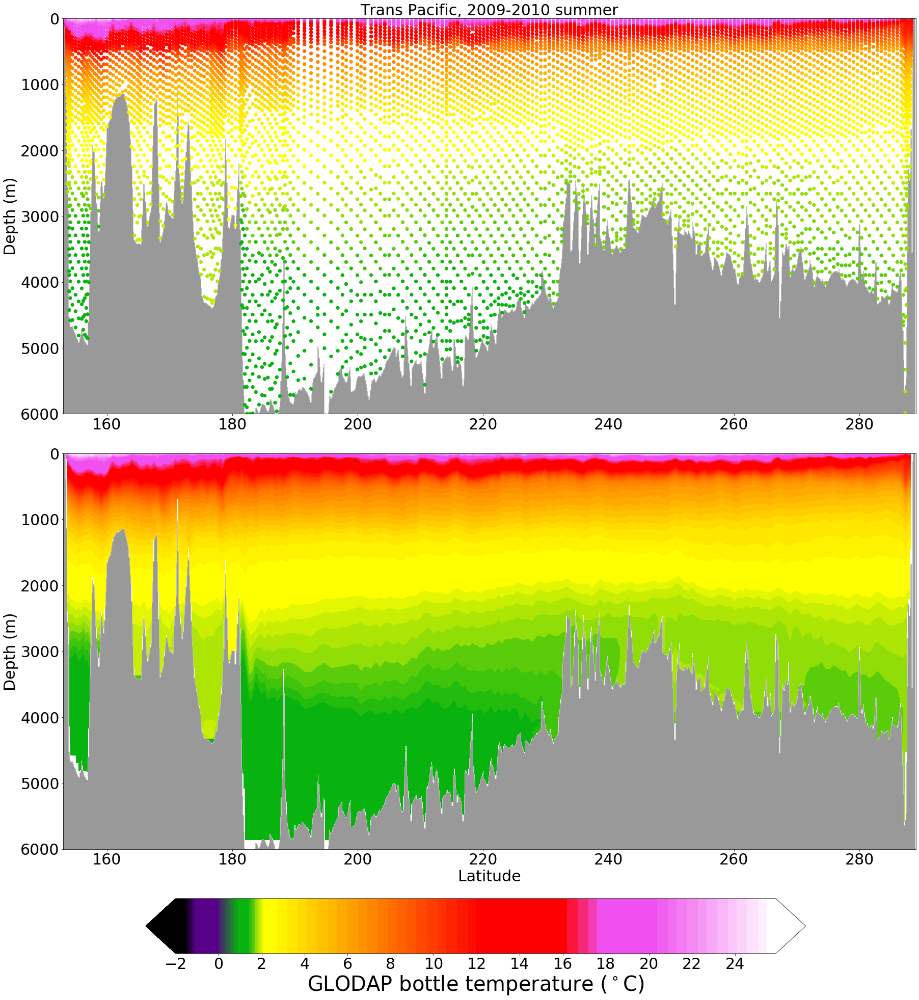

In [68]:
norm = col.DivergingNorm(vmin=-2., vcenter=2.5, vmax=26)
levels = np.arange(-2,26,0.1)

fig, ax, var = plot_GLODAP_profile_TP(TP_temp_2010_scatter, (TP_temp_2010_grid*bathymetry_mask_TP), bathymetry_mask_TP,norm, levels)
ax.set_title('Trans Pacific, 2009-2010 summer', fontsize = 30)

cax = fig.add_axes([0.2, 0.03, 0.6, 0.05])
cbar=plt.colorbar(var,cax = cax,orientation='horizontal',shrink = 0.5, ticks = [-2,0,2,4,6,8,10,12,14,16,18,20,22,24,26])
cbar.set_label(r'GLODAP bottle temperature ($^\circ$C)', fontsize = 40)
# figurepath = 'IO6S_temperature.png'
# plt.savefig(figurepath, dpi=None, facecolor='w', edgecolor='w',orientation='portrait', papertype=None, format='png',transparent=False, bbox_inches='tight', pad_inches=0.1,frameon=None)

plt.show()

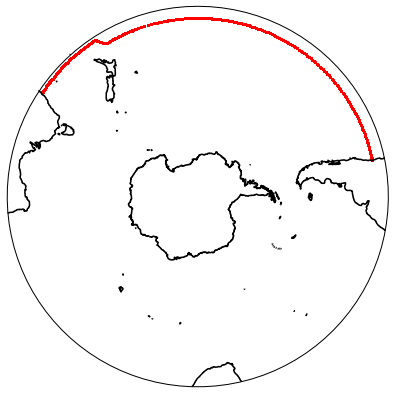

In [69]:
# where is this line?
fig = plt.figure(figsize=[7, 7])
proj = ccrs.Stereographic(central_longitude=-150,central_latitude=-90)
ax= plt.subplot( projection =proj)
lat_north = -29
ax.set_extent([-180, 180, -90, lat_north], ccrs.PlateCarree())
ax.contour(land_map.sel(yt_ocean = slice(-90,lat_north)).xt_ocean, land_map.sel(yt_ocean = slice(-90,lat_north)).yt_ocean,land_map.sel(yt_ocean = slice(-90,lat_north)),[0,1], colors = 'k', alpha = 1, transform=ccrs.PlateCarree())
ax.scatter(TP_longitude, TP_latitude, s = 2, c = 'r', transform = ccrs.PlateCarree())
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)
plt.show()

## Example 14: Trans Indian 32S Crossing (TI)

In [70]:
help(TI_GLODAP_profile)

Help on function TI_GLODAP_profile in module GLODAP_WOCE_sections:

TI_GLODAP_profile(variable, unique_cruise, year, so_glodap)
    Extracts GLODAP bottle data collected along a trans Indian southern ocean transect (around 32S)
    Bottle data along the cruise line are compressed into longitude/depth space (ignoring small variations in latitude from the main line) then the point data are linearly interpolated onto fine vertical and horizontal grids to aid visualisation.
    A bathymetry file is generated from information collected from all crossings, this is also linearly interpolated onto a fine longitude grid and used to mask out where interpolation assigns tracer values to non ocean locations.
    
    returns TI_var_linear, TI_var_linear_horizontal, var_TI, bathymetry_mask,TI_latitude, TI_longitude
    
    inputs:
    variable = string of variable to be extracted, as in so_glodap.VARIABLES (e.g. 'temperature', 'salinity')
    unique_cruise = list of indices marking hte start of ea

In [71]:
_, TI_temp_2002_grid, TI_temp_2002_scatter, bathymetry_mask_TI,TI_longitude, TI_latitude = TI_GLODAP_profile('temperature', unique_cruise, '2002', so_glodap)

In [72]:
def plot_GLODAP_profile_TI(var_profile_scatter, var_profile_contour, bathymetry,norm, levels):
    fig = plt.figure(figsize=[30, 30])
    gs = gridspec.GridSpec(2,1)
    ax, ax1= plt.subplot(gs[0]), plt.subplot(gs[1])
    gs.update(hspace = 0.1)

    cmap = nclcmaps.cmap('tbrVar1')
    
    ax.contourf(bathymetry.longitude, bathymetry.depth, bathymetry.fillna(0).values.T, levels = [-1,0,1], colors = ['k', 'w', 'w'], alpha = 0.4)
    var = ax.scatter(var_profile_scatter.longitude, var_profile_scatter.depth, s= 40, c = var_profile_scatter.values, cmap = cmap, norm = norm)
    ax.set_ylim([6000,0])
    ax.set_xlim([30,116])
    ax.set_ylabel('Depth (m)', fontsize = 30)
    
    ax1.contourf(bathymetry.longitude, bathymetry.depth, bathymetry.fillna(0).values.T, levels = [-1,0,1], colors = ['k', 'w', 'w'], alpha = 0.4)
    var = ax1.contourf(var_profile_contour.longitude, var_profile_contour.depth, var_profile_contour.values.T, cmap = cmap, levels = levels, norm = norm, extend = 'both')
    ax1.set_ylim([6000,0])
    ax1.set_xlim([30,116])
    ax1.set_ylabel('Depth (m)', fontsize = 30)
    ax1.set_xlabel('Latitude', fontsize = 30)
    
    return fig, ax, var

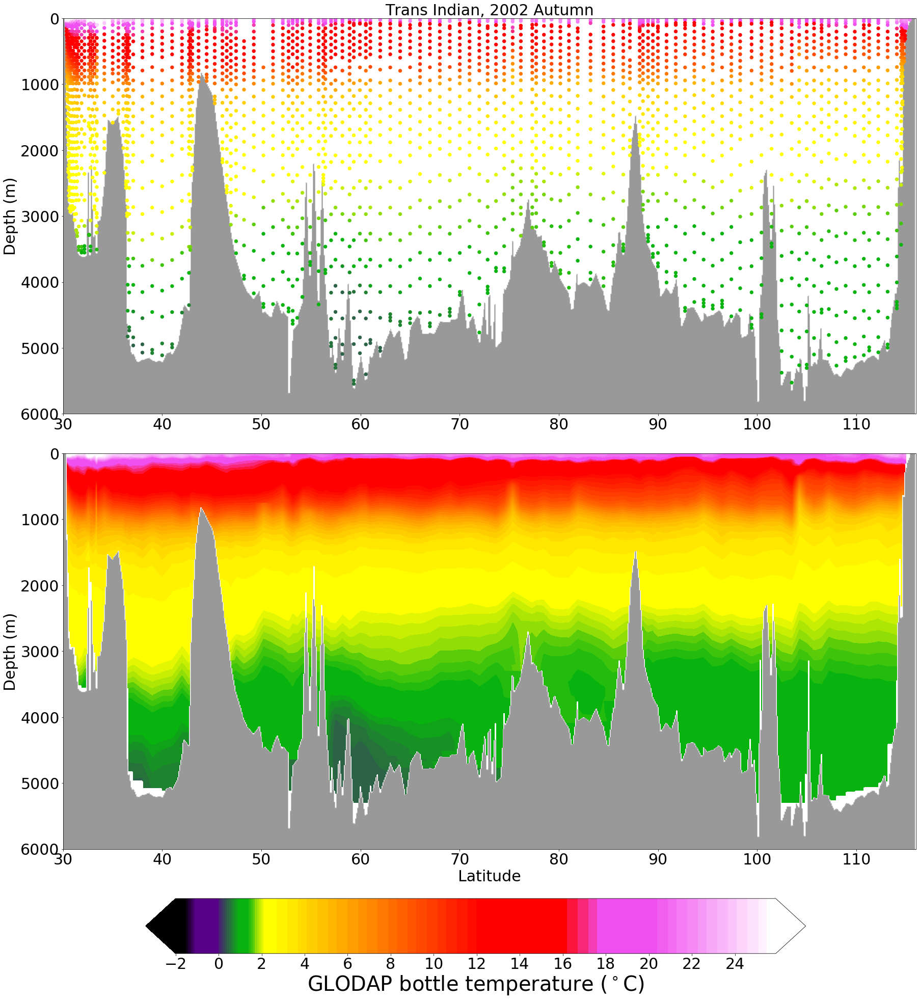

In [73]:
norm = col.DivergingNorm(vmin=-2., vcenter=2.5, vmax=26)
levels = np.arange(-2,26,0.1)

fig, ax, var = plot_GLODAP_profile_TI(TI_temp_2002_scatter, (TI_temp_2002_grid*bathymetry_mask_TI), bathymetry_mask_TI,norm, levels)
ax.set_title('Trans Indian, 2002 Autumn', fontsize = 30)

cax = fig.add_axes([0.2, 0.03, 0.6, 0.05])
cbar=plt.colorbar(var,cax = cax,orientation='horizontal',shrink = 0.5, ticks = [-2,0,2,4,6,8,10,12,14,16,18,20,22,24,26])
cbar.set_label(r'GLODAP bottle temperature ($^\circ$C)', fontsize = 40)
# figurepath = 'IO6S_temperature.png'
# plt.savefig(figurepath, dpi=None, facecolor='w', edgecolor='w',orientation='portrait', papertype=None, format='png',transparent=False, bbox_inches='tight', pad_inches=0.1,frameon=None)

plt.show()

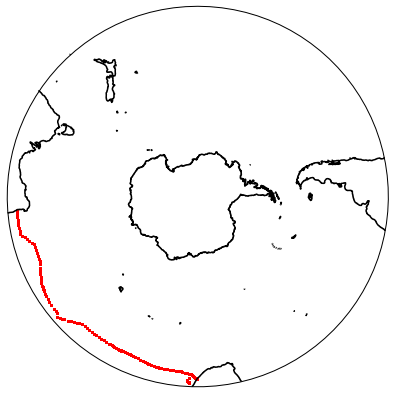

In [74]:
# where is this line?
fig = plt.figure(figsize=[7, 7])
proj = ccrs.Stereographic(central_longitude=-150,central_latitude=-90)
ax= plt.subplot( projection =proj)
lat_north = -29
ax.set_extent([-180, 180, -90, lat_north], ccrs.PlateCarree())
ax.contour(land_map.sel(yt_ocean = slice(-90,lat_north)).xt_ocean, land_map.sel(yt_ocean = slice(-90,lat_north)).yt_ocean,land_map.sel(yt_ocean = slice(-90,lat_north)),[0,1], colors = 'k', alpha = 1, transform=ccrs.PlateCarree())
ax.scatter(TI_longitude, TI_latitude, s = 2, c = 'r', transform = ccrs.PlateCarree())
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)
plt.show()

## Example 15: Trans Atlantic 30-45S Crossing (TAa)

In [75]:
help(TAa_GLODAP_profile)

Help on function TAa_GLODAP_profile in module GLODAP_WOCE_sections:

TAa_GLODAP_profile(variable, unique_cruise, so_glodap)
    Extracts GLODAP bottle data collected along a trans Atlantic southern ocean transect (ranges 30S to 45S)
    Bottle data along the cruise line are compressed into longitude/depth space (ignoring small variations in latitude from the main line) then the point data are linearly interpolated onto fine vertical and horizontal grids to aid visualisation.
    A bathymetry file is generated from information collected from all crossings, this is also linearly interpolated onto a fine longitude grid and used to mask out where interpolation assigns tracer values to non ocean locations.
    
    returns TA_var_linear, TIAvar_linear_horizontal, var_TA, bathymetry_mask,TA_latitude, TA_longitude
    
    Only one crossing available (1992-1993 summer).
    inputs:
    variable = string of variable to be extracted, as in so_glodap.VARIABLES (e.g. 'temperature', 'salinity')
  

In [76]:
_, TAa_temp_grid, TAa_temp_scatter, bathymetry_mask_TAa,TAa_longitude, TAa_latitude = TAa_GLODAP_profile('temperature', unique_cruise, so_glodap)

In [77]:
def plot_GLODAP_profile_TAa(var_profile_scatter, var_profile_contour, bathymetry,norm, levels):
    fig = plt.figure(figsize=[30, 30])
    gs = gridspec.GridSpec(2,1)
    ax, ax1= plt.subplot(gs[0]), plt.subplot(gs[1])
    gs.update(hspace = 0.1)

    cmap = nclcmaps.cmap('tbrVar1')
    
    ax.contourf(bathymetry.longitude, bathymetry.depth, bathymetry.fillna(0).values.T, levels = [-1,0,1], colors = ['k', 'w', 'w'], alpha = 0.4)
    var = ax.scatter(var_profile_scatter.longitude, var_profile_scatter.depth, s= 40, c = var_profile_scatter.values, cmap = cmap, norm = norm)
    ax.set_ylim([6000,0])
    ax.set_xlim([-61,16])
    ax.set_ylabel('Depth (m)', fontsize = 30)
    
    ax1.contourf(bathymetry.longitude, bathymetry.depth, bathymetry.fillna(0).values.T, levels = [-1,0,1], colors = ['k', 'w', 'w'], alpha = 0.4)
    var = ax1.contourf(var_profile_contour.longitude, var_profile_contour.depth, var_profile_contour.values.T, cmap = cmap, levels = levels, norm = norm, extend = 'both')
    ax1.set_ylim([6000,0])
    ax1.set_xlim([-61,16])
    ax1.set_ylabel('Depth (m)', fontsize = 30)
    ax1.set_xlabel('Latitude', fontsize = 30)
    
    return fig, ax, var

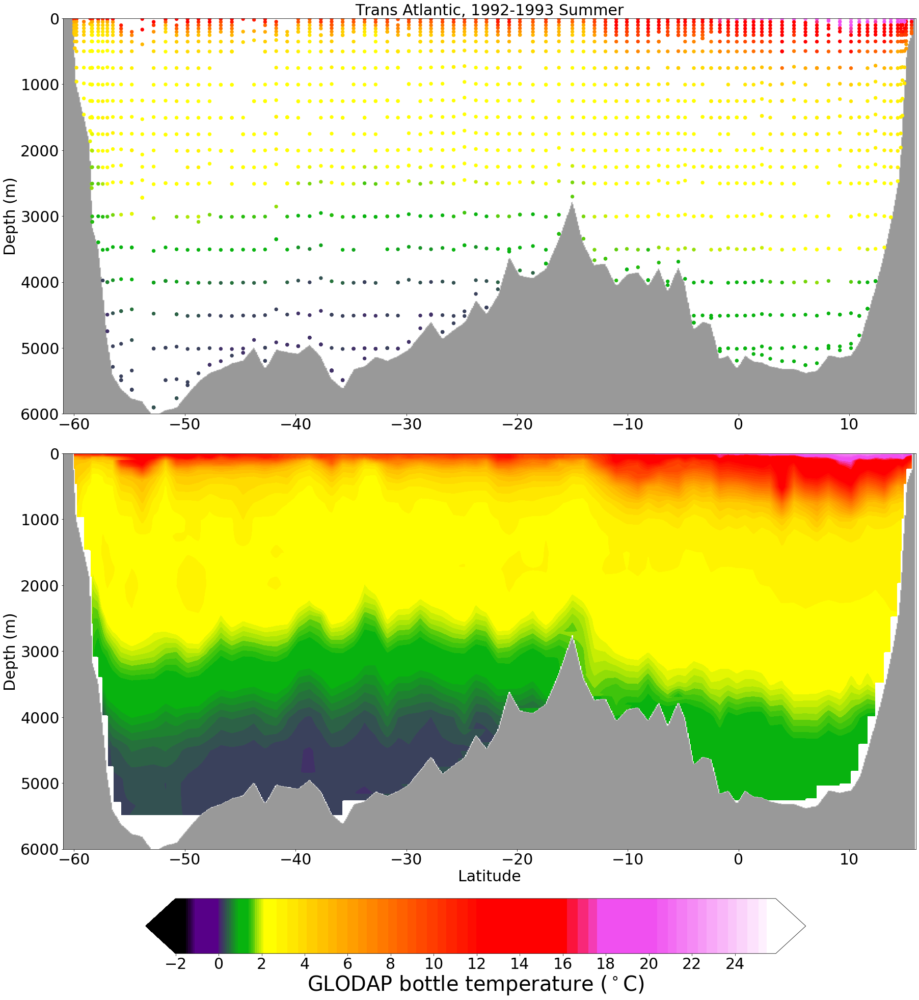

In [78]:
norm = col.DivergingNorm(vmin=-2., vcenter=2.5, vmax=26)
levels = np.arange(-2,26,0.1)

fig, ax, var = plot_GLODAP_profile_TAa(TAa_temp_scatter, (TAa_temp_grid*bathymetry_mask_TAa), bathymetry_mask_TAa,norm, levels)
ax.set_title('Trans Atlantic, 1992-1993 Summer', fontsize = 30)

cax = fig.add_axes([0.2, 0.03, 0.6, 0.05])
cbar=plt.colorbar(var,cax = cax,orientation='horizontal',shrink = 0.5, ticks = [-2,0,2,4,6,8,10,12,14,16,18,20,22,24,26])
cbar.set_label(r'GLODAP bottle temperature ($^\circ$C)', fontsize = 40)
# figurepath = 'IO6S_temperature.png'
# plt.savefig(figurepath, dpi=None, facecolor='w', edgecolor='w',orientation='portrait', papertype=None, format='png',transparent=False, bbox_inches='tight', pad_inches=0.1,frameon=None)

plt.show()

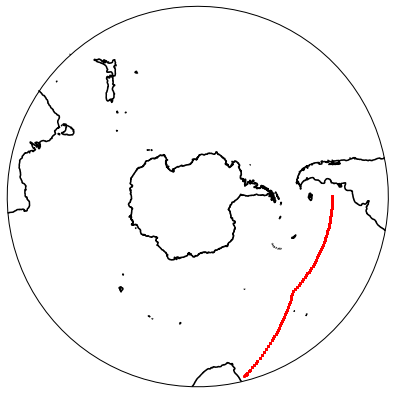

In [79]:
# where is this line?
fig = plt.figure(figsize=[7, 7])
proj = ccrs.Stereographic(central_longitude=-150,central_latitude=-90)
ax= plt.subplot( projection =proj)
lat_north = -29
ax.set_extent([-180, 180, -90, lat_north], ccrs.PlateCarree())
ax.contour(land_map.sel(yt_ocean = slice(-90,lat_north)).xt_ocean, land_map.sel(yt_ocean = slice(-90,lat_north)).yt_ocean,land_map.sel(yt_ocean = slice(-90,lat_north)),[0,1], colors = 'k', alpha = 1, transform=ccrs.PlateCarree())
ax.scatter(TAa_longitude, TAa_latitude, s = 2, c = 'r', transform = ccrs.PlateCarree())
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)
plt.show()

## Example 16: Trans Atlantic 35S Crossing (TAb)

In [80]:
help(TAb_GLODAP_profile)

Help on function TAb_GLODAP_profile in module GLODAP_WOCE_sections:

TAb_GLODAP_profile(variable, unique_cruise, so_glodap)
    Extracts GLODAP bottle data collected along a trans Atlantic southern ocean transect (35S)
    Bottle data along the cruise line are compressed into longitude/depth space (ignoring small variations in latitude from the main line) then the point data are linearly interpolated onto fine vertical and horizontal grids to aid visualisation.
    A bathymetry file is generated from information collected from all crossings, this is also linearly interpolated onto a fine longitude grid and used to mask out where interpolation assigns tracer values to non ocean locations.
    
    returns TA_var_linear, TIAvar_linear_horizontal, var_TA, bathymetry_mask,TA_latitude, TA_longitude
    
    Only one crossing available (2017 summer).
    inputs:
    variable = string of variable to be extracted, as in so_glodap.VARIABLES (e.g. 'temperature', 'salinity')
    unique_cruise = l

In [81]:
_, TAb_temp_grid, TAb_temp_scatter, bathymetry_mask_TAb,TAb_longitude, TAb_latitude = TAb_GLODAP_profile('temperature', unique_cruise, so_glodap)

In [82]:
def plot_GLODAP_profile_TAb(var_profile_scatter, var_profile_contour, bathymetry,norm, levels):
    fig = plt.figure(figsize=[30, 30])
    gs = gridspec.GridSpec(2,1)
    ax, ax1= plt.subplot(gs[0]), plt.subplot(gs[1])
    gs.update(hspace = 0.1)

    cmap = nclcmaps.cmap('tbrVar1')
    
    ax.contourf(bathymetry.longitude, bathymetry.depth, bathymetry.fillna(0).values.T, levels = [-1,0,1], colors = ['k', 'w', 'w'], alpha = 0.4)
    var = ax.scatter(var_profile_scatter.longitude, var_profile_scatter.depth, s= 40, c = var_profile_scatter.values, cmap = cmap, norm = norm)
    ax.set_ylim([6000,0])
    ax.set_xlim([-54,20])
    ax.set_ylabel('Depth (m)', fontsize = 30)
    
    ax1.contourf(bathymetry.longitude, bathymetry.depth, bathymetry.fillna(0).values.T, levels = [-1,0,1], colors = ['k', 'w', 'w'], alpha = 0.4)
    var = ax1.contourf(var_profile_contour.longitude, var_profile_contour.depth, var_profile_contour.values.T, cmap = cmap, levels = levels, norm = norm, extend = 'both')
    ax1.set_ylim([6000,0])
    ax1.set_xlim([-54,20])
    ax1.set_ylabel('Depth (m)', fontsize = 30)
    ax1.set_xlabel('Latitude', fontsize = 30)
    
    return fig, ax, var

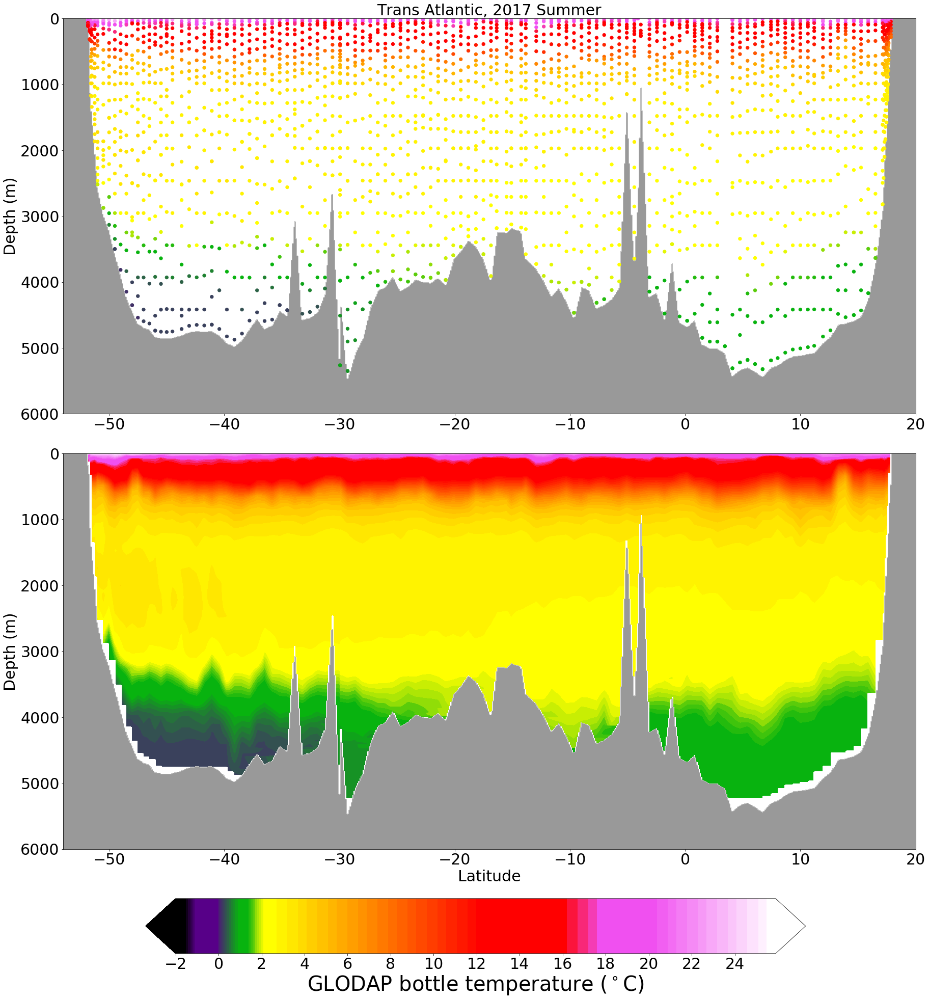

In [83]:
norm = col.DivergingNorm(vmin=-2., vcenter=2.5, vmax=26)
levels = np.arange(-2,26,0.1)

fig, ax, var = plot_GLODAP_profile_TAb(TAb_temp_scatter, (TAb_temp_grid*bathymetry_mask_TAb), bathymetry_mask_TAb,norm, levels)
ax.set_title('Trans Atlantic, 2017 Summer', fontsize = 30)

cax = fig.add_axes([0.2, 0.03, 0.6, 0.05])
cbar=plt.colorbar(var,cax = cax,orientation='horizontal',shrink = 0.5, ticks = [-2,0,2,4,6,8,10,12,14,16,18,20,22,24,26])
cbar.set_label(r'GLODAP bottle temperature ($^\circ$C)', fontsize = 40)
# figurepath = 'IO6S_temperature.png'
# plt.savefig(figurepath, dpi=None, facecolor='w', edgecolor='w',orientation='portrait', papertype=None, format='png',transparent=False, bbox_inches='tight', pad_inches=0.1,frameon=None)

plt.show()

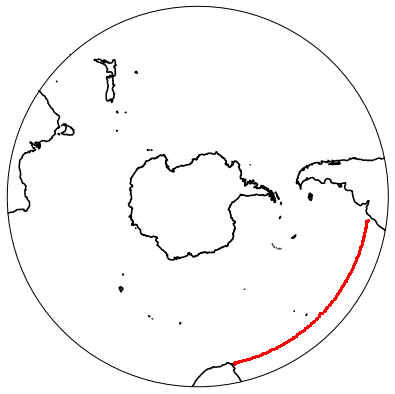

In [84]:
# where is this line?
fig = plt.figure(figsize=[7, 7])
proj = ccrs.Stereographic(central_longitude=-150,central_latitude=-90)
ax= plt.subplot( projection =proj)
lat_north = -29
ax.set_extent([-180, 180, -90, lat_north], ccrs.PlateCarree())
ax.contour(land_map.sel(yt_ocean = slice(-90,lat_north)).xt_ocean, land_map.sel(yt_ocean = slice(-90,lat_north)).yt_ocean,land_map.sel(yt_ocean = slice(-90,lat_north)),[0,1], colors = 'k', alpha = 1, transform=ccrs.PlateCarree())
ax.scatter(TAb_longitude, TAb_latitude, s = 2, c = 'r', transform = ccrs.PlateCarree())
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)
plt.show()

# Map of all processed WOCE lines

In [85]:
IO6S_positions = np.stack([IO6S_longitude, IO6S_latitude])
SO4P_positions = np.stack([SO4P_longitude, SO4P_latitude])
IO8S_positions = np.stack([IO8S_longitude, IO8S_latitude])
IO9S_positions = np.stack([IO9S_longitude, IO9S_latitude])
SO4A_positions = np.stack([SO4A_longitude, SO4A_latitude])
P16A_positions = np.stack([P16A_longitude, P16A_latitude])
P12_positions = np.stack([P12_longitude, P12_latitude])
P15_positions = np.stack([P15_longitude, P15_latitude])
A12a_positions = np.stack([A12a_longitude, A12a_latitude])
A12b_positions = np.stack([A12b_longitude, A12b_latitude])
A23_positions = np.stack([A23_longitude, A23_latitude])
P19_positions = np.stack([P19_longitude, P19_latitude])

IO6S_positions = np.unique(IO6S_positions, axis = 1)
SO4P_positions = np.unique(SO4P_positions, axis = 1)
IO8S_positions = np.unique(IO8S_positions, axis = 1)
IO9S_positions = np.unique(IO9S_positions, axis = 1)
SO4A_positions = np.unique(SO4A_positions, axis = 1)
P16A_positions = np.unique(P16A_positions, axis = 1)
P12_positions = np.unique(P12_positions, axis = 1)
P15_positions = np.unique(P15_positions, axis = 1)
A12a_positions = np.unique(A12a_positions, axis = 1)
A12b_positions = np.unique(A12b_positions, axis = 1)
A23_positions = np.unique(A23_positions, axis = 1)
P19_positions = np.unique(P19_positions, axis = 1)

a = SO4P_positions[0,:]
a[-4] = a[-4] - 360
a[-3] = a[-3] - 360
a[-2] = a[-2] - 360
a[-1] = a[-1] - 360
SO4P_positions = xr.DataArray(SO4P_positions[1,:], coords = [a], dims = ['longitude'])
SO4P_positions = SO4P_positions.sortby('longitude')
P15_positions = xr.DataArray(P15_positions[0,:], coords = [P15_positions[1,:]], dims = ['latitude'])
P15_positions = P15_positions.sortby('latitude')
IO6S_positions = xr.DataArray(IO6S_positions[0,:], coords = [IO6S_positions[1,:]], dims = ['latitude'])
IO6S_positions = IO6S_positions.sortby('latitude')
IO8S_positions = xr.DataArray(IO8S_positions[0,:], coords = [IO8S_positions[1,:]], dims = ['latitude'])
IO8S_positions = IO8S_positions.sortby('latitude')
IO9S_positions = xr.DataArray(IO9S_positions[0,:], coords = [IO9S_positions[1,:]], dims = ['latitude'])
IO9S_positions = IO9S_positions.sortby('latitude')
SO4A_positions = xr.DataArray(SO4A_positions[1,:], coords = [SO4A_positions[0,:]], dims = ['longitude'])
SO4A_positions = SO4A_positions.sortby('longitude')
P16A_positions = xr.DataArray(P16A_positions[0,:], coords = [P16A_positions[1,:]], dims = ['latitude'])
P16A_positions = P16A_positions.sortby('latitude')
P12_positions = xr.DataArray(P12_positions[0,:], coords = [P12_positions[1,:]], dims = ['latitude'])
P12_positions = P12_positions.sortby('latitude')
A12a_positions = xr.DataArray(A12a_positions[0,:], coords = [A12a_positions[1,:]], dims = ['latitude'])
A12a_positions = A12a_positions.sortby('latitude')
A12b_positions = xr.DataArray(A12b_positions[0,:], coords = [A12b_positions[1,:]], dims = ['latitude'])
A12b_positions = A12b_positions.sortby('latitude')
A23_positions = xr.DataArray(A23_positions[0,:], coords = [A23_positions[1,:]], dims = ['latitude'])
A23_positions = A23_positions.sortby('latitude')
P19_positions = xr.DataArray(P19_positions[0,:], coords = [P19_positions[1,:]], dims = ['latitude'])
P19_positions = P19_positions.sortby('latitude')
TP_positions = np.stack([TP_longitude, TP_latitude])
TP_positions = np.unique(TP_positions, axis = 1)
TP_positions = xr.DataArray(TP_positions[1,:], coords = [TP_positions[0,:]], dims = ['longitude'])
TP_positions = TP_positions.sortby('longitude')
TI_positions = np.stack([TI_longitude, TI_latitude])
TI_positions = np.unique(TI_positions, axis = 1)
TI_positions = xr.DataArray(TI_positions[1,:], coords = [TI_positions[0,:]], dims = ['longitude'])
TI_positions = TI_positions.sortby('longitude')
TAa_positions = np.stack([TAa_longitude, TAa_latitude])
TAa_positions = np.unique(TAa_positions, axis = 1)
TAa_positions = xr.DataArray(TAa_positions[1,:], coords = [TAa_positions[0,:]], dims = ['longitude'])
TAa_positions = TAa_positions.sortby('longitude')
TAb_positions = np.stack([TAb_longitude, TAb_latitude])
TAb_positions = np.unique(TAb_positions, axis = 1)
TAb_positions = xr.DataArray(TAb_positions[1,:], coords = [TAb_positions[0,:]], dims = ['longitude'])
TAb_positions = TAb_positions.sortby('longitude')


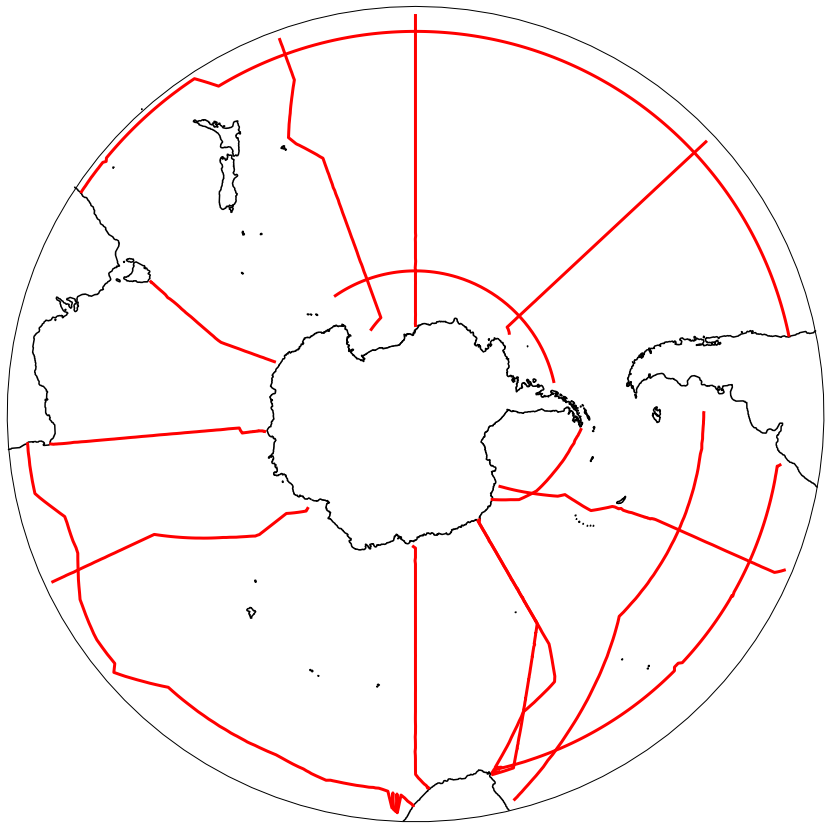

In [86]:
# where is this line?
fig = plt.figure(figsize=[15, 15])
proj = ccrs.Stereographic(central_longitude=-150,central_latitude=-90)
ax= plt.subplot( projection =proj)
lat_north = -29
ax.set_extent([-180, 180, -90, lat_north], ccrs.PlateCarree())
ax.contour(land_map.sel(yt_ocean = slice(-90,lat_north)).xt_ocean, land_map.sel(yt_ocean = slice(-90,lat_north)).yt_ocean,land_map.sel(yt_ocean = slice(-90,lat_north)),[0,1], colors = 'k', alpha = 1, transform=ccrs.PlateCarree())

ax.plot(IO6S_positions.values, IO6S_positions.latitude, c = 'r', linewidth = 3, transform = ccrs.PlateCarree())
ax.plot(SO4P_positions.longitude, SO4P_positions.values, c = 'r', linewidth = 3, transform = ccrs.PlateCarree())
ax.plot(IO8S_positions.values, IO8S_positions.latitude, c = 'r', linewidth = 3, transform = ccrs.PlateCarree())
ax.plot(IO9S_positions.values, IO9S_positions.latitude, c = 'r', linewidth = 3, transform = ccrs.PlateCarree())
ax.plot(SO4A_positions.longitude, SO4A_positions.values, c = 'r', linewidth = 3, transform = ccrs.PlateCarree())
ax.plot(P16A_positions.values, P16A_positions.latitude, c = 'r', linewidth = 3, transform = ccrs.PlateCarree())
ax.plot(P12_positions.values, P12_positions.latitude, c = 'r', linewidth = 3, transform = ccrs.PlateCarree())
ax.plot(P15_positions.values, P15_positions.latitude, c = 'r', linewidth = 3, transform = ccrs.PlateCarree())
ax.plot(P19_positions.values, P19_positions.latitude, c = 'r', linewidth = 3, transform = ccrs.PlateCarree())
ax.plot(A12a_positions.values, A12a_positions.latitude, c = 'r', linewidth = 3, transform = ccrs.PlateCarree())
ax.plot(A12b_positions.values, A12b_positions.latitude, c = 'r', linewidth = 3, transform = ccrs.PlateCarree())
ax.plot(A23_positions.values, A23_positions.latitude, c = 'r', linewidth = 3, transform = ccrs.PlateCarree())
ax.plot(TP_positions.longitude, TP_positions.values, c = 'r', linewidth = 3, transform = ccrs.PlateCarree())
ax.plot(TI_positions.longitude, TI_positions.values, c = 'r', linewidth = 3, transform = ccrs.PlateCarree())
ax.plot(TAb_positions.longitude, TAb_positions.values, c = 'r', linewidth = 3, transform = ccrs.PlateCarree())
ax.plot(TAa_positions.longitude, TAa_positions.values, c = 'r', linewidth = 3, transform = ccrs.PlateCarree())


theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)
plt.show()